# TVB-NEST: Bridging multiscale activity by co-simulation

## Step-by-step learn how to perform a co-simulation embedding spiking neural networks into large-scale brain networks using TVB.

## tvb-multiscale toolbox:

### https://github.com/the-virtual-brain/tvb-multiscale

For questions use the git issue tracker, or write an e-mail to me: dionysios.perdikis@charite.de

## Reduced Wong-Wang mean field model

For every region node $n\prime$ modelled as a mean-field node in TVB:

(Post)Synaptic gating dynamics (i.e., proportion of synapse channels open at any given time):

$\dot{S_{n\prime}}^{(E)} = - \frac{1}{\tau_E}{S_{n\prime}}^{(E)}(t) + (1-{S_{n\prime}}^{(E)}(t))\gamma_{E} {r_{n\prime}}^{(E)}(t)$

$\dot{S_{n\prime}}^{(I)} = - \frac{1}{\tau_I}{S_{n\prime}}^{(I)}(t) + \gamma_I{r_{n\prime}}^{(I)}(t)$

where we bound ${S_{n\prime}}^{(E/I)}(t) \in $ [0.0, 1.0], 

and $ {r_{n\prime}}^{(E/I)}(t) $ is the postsynaptic firing rate given by:

$ {r_{n\prime}}^{(E/I)}(t) = H({I_{syn_{n\prime}}}^{(E/I)}(t), a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) $

where

$ H({I_{syn_{n\prime}}}^{(E/I)}(t),  a_{(E/I)}, b_{(E/I)}, d_{(E/I)}) = \frac{a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)}}{1-e^{-d_{(E/I)}(a_{(E/I)}{I_{syn_{n\prime}}}^{(E/I)}(t)-b_{(E/I)})}}$ 

is a sigmoidal activation function of the input presynaptic current.

The total input presynaptic current to excitatory populations is given by: 

$ {I_{syn_{n\prime}}}^{(E)}(t) = W_EI_o + w_+J_{NMDA}{S_{n\prime}}^{(E)}(t) - J_{{n\prime}}{S_{n\prime}}^{(I)}(t) + GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

and to inhibitory ones:

$ {I_{syn_{n\prime}}}^{(I)}(t) = W_II_o + J_{NMDA}{S_{n\prime}}^{(E)}(t) - {S_{n\prime}}^{(I)}(t) +  \lambda GJ_{NMDA}\sum_{{m\prime}\neq {n\prime}}C_{{m\prime}{n\prime}}S_{m\prime}^{(E)}(t-\tau_{{m\prime}{n\prime}})$

where 
$\lambda  \in$[0, 1] for scaling feedforward inhibition.

TVB connectivity weights $C_{{m\prime}{n\prime}}$ are scaled per "region"

## Reduced Wong-Wang mean field model

## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{m\prime}{n\prime}}$ (${m\prime}->{n\prime}$)
- structural TVB connectivity delays $\tau_{{m\prime}{n\prime}}$  (${m\prime}->{n\prime}$)
- global structural brain connectivity coupling constant $G$
- overall effective external input current $I_o = 0.382nA$ 
- excitatory synaptic coupling $J_{NDMA} = 0.15nA$ 
- local feedback inhibitory synaptic coupling $J_{i} = 1.0nA$ 
- local excitatory recurrence $w_+ = 1.4$
- excitatory kinetic parameter $\gamma_E = 0.641 s$
- inhibitory kinetic parameter $\gamma_I = 1.0 s$
- excitatory (NMDA) time constant $\tau_E = \tau_{NMDA}=100ms$ 
- inhibitory (GABA) time constant $\tau_I = \tau_{GABA}=10ms$ 
- excitatory pool scaling constant $W_E = 1.0$
- inhibitory pool scaling constant $W_I = 0.7$
- excitatory sigmoidal functions parameters $a_{E} = 310nC^{-1}$, $b_{E} = 125Hz$, $d_{E} = 0.16s$
- inhibitory sigmoidal functions parameters $a_{I} = 615nC^{-1}$, $b_{I} = 177Hz$, $d_{I} = 0.087s$
- $\lambda \in [0.0, 1.0]$, allowing for feedforward inhibition


## Spiking network model in TVB

For every neuron $i$ in region node $n$ modelled in TVB as a spiking network:


$ {C_m}_{E/I}{\dot{V}_{ni}}^m = - {I_{ni}}^L(t) - {I_{ni}}^{AMPA}(t) - {I_{ni}}^{NMDA}(t) - {I_{ni} ^{GABA}}(t)- {I_{ni}}^{AMPA,ext}(t)-G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n}) +{I_{ni}}^{ext}(t) $

$\;\;\;\;\;\;\;\;\;\;=-{g_m}_{E/I}({V_{ni}}^m(t) - V_L) $
              
$\;\;\;\;\;\;\;\;\;\;\;-{g_{AMPA}}_{E/I}({V_{ni}}^m(t) - V_E)\sum_{j=1}^{N_{n,E}}{w_{n,ij}{s_{nj}}^{AMPA}(t)} $

$\;\;\;\;\;\;\;\;\;\;\;-\frac{{g_{NMDA}}_{E/I}({V_{ni}}^m(t) - V_E)}{1+\lambda_{NMDA}e^{-\beta{V_{ni}}^m(t)}}\sum_{j=1}^{N_{n,E}}{w_{n,ij}{s_{nj}}^{NMDA}(t)} $

$\;\;\;\;\;\;\;\;\;\;\;-{g_{GABA}}_{E/I}({V_{ni}}^m(t) - V_I)\sum_{j=1}^{N_{n,I}}{w_{n,ij}{s_{nj}}^{GABA}(t)} $

$\;\;\;\;\;\;\;\;\;\;\;-{g_{AMPA,ext}}_{E/I}({V_{ni}}^m(t) - V_E)G_{E/I}\sum_{n\prime n}{C_{n\prime n}\sum_{j=1}^{N_{n\prime n,E}}{{w_{n\prime n,ij}{s_{n\prime j}}^{AMPA,ext}(t-\tau_{n\prime n})}}} $

$\;\;\;\;\;\;\;\;\;\;\;+{I_{ni}}^{ext}(t) $

$ {\dot{s}_{n,i \in E/I}}^{AMPA/GABA} = -\frac{1}{\tau_{AMPA/GABA}}{s_{n,i \in E/I}}^{AMPA/GABA}(t) +  \sum_k \delta(t-{t_{n,i \in E/I}}^k)$

$ {\dot{x}_{n,i \in E}}^{NMDA} = -\frac{1}{\tau_{NMDA,rise}}{x_{n,i \in E}}^{NMDA}(t) +  \sum_k \delta(t-{t_{n,i \in E}}^k)$

$ {\dot{s}_{n,i \in E}}^{NMDA} = -\frac{1}{\tau_{NMDA,decay}}{s_{n,i \in E}}^{NMDA}(t) + \alpha {x_{n,i \in E}}^{NMDA}(t) (1 - {s_{n,i \in E}}^{NMDA}(t)) $

$ {\dot{s}_{n\prime n,i \in E}}^{AMPA,ext} = -\frac{1}{\tau_{AMPA}}{s_{n\prime n,i \in E}}^{AMPA,ext}(t) + \sum_k \delta(t-{t_{n\prime n, i \in E}}^k) $

Where 

generally

$ w_{i \in E, j \in E} = w+ $

$ w_{i \in I, j \in E} = J_i $

and the global structural brain connectivity coupling constant G:

$G_{I} = \lambda * G_{E}, \lambda \in [0.0, 1.0]$

for feedforward inhibition.

Boundaries:

$ {s_{n,exc/inh}}^{AMPA/NMDA/GABA/AMPA,ext}(t) \in [0.0, 1.0]$


When $V_m(t) > V_{thr}$, emit a spike and clamp $V_m(t)$ to $V_{reset}$ for ${\tau_{ref}}_{E/I}$ ms.


## Parameters following Ponce-Alvarez et al 2014:

- structural TVB connectivity weights $C_{{n\prime},n}$ (${n\prime}->n$)
- structural TVB connectivity delays $\tau_{{n\prime},n}$  (${n\prime}->n$)
- leak membrane potential $ V_L = -70 mV $
- threshold membrane potential $ V_{thr} = -50mV $
- reset membrane potential $ V_{reset} = -55mV $
- AMPA time constant $ \tau_{AMPA} = 2ms $
- GABA time constant $\tau_{GABA}=10ms$ 
- NMDA rise time constant $ \tau_{NMDA,rise}=2ms$ 
- NMDA decay time constant $ \tau_{NMDA,decay}=100ms$
- NMDA synapse sigmoidal parameters: $\alpha = 0.5 kHz, \beta = 0.062, \lambda_{NMDA} = 0.28$
- Excitatory/Inhibitory refractory time ${\tau_{ref}}_{E/I} = 2/1ms$
- Excitatory/Inhibitory reversal potential $V_{E/I} = 0 /-70mV$
- Excitatory/Inhibitory membrane capacitance $ {C_m}_{E/I} = 0.5/0.2nF $
- Excitatory/Inhibitory membrane conductance $ {g_m}_{E/I} = 25/20nS $
- Excitatory/Inhibitory AMPA,ext membrane conductance $ {g_{AMPA,ext}}_{E/I} = 3.37/2.59nS $
- Excitatory/Inhibitory AMPA membrane conductance $ {g_{AMPA}}_{E/I} = 0.065/0.051nS $
- Excitatory/Inhibitory GABA membrane conductance $ {g_{GABA}}_{E/I} = 10.94/8.51nS $
- Excitatory/Inhibitory NMDA membrane conductance $ {g_{NMDA}}_{E/I} = 0.20/0.16nS $
- local feedback inhibitory synaptic weight $J_{i} = 1.0$ 
- local excitatory synaptic recurrent weight $w+ = 1.4$
- local excitatory to inhibitory synaptic weight $ w_{i \in E, j \in I} = 1.0 $
- local inhibitory synaptic recurrent weight $ w_{i \in I, j \in I} = 1.0 $



For TVB to NEST coupling:

The term 

$ G\sum_{n\prime n}C_{n\prime \neq n}{I_{n\prime n,i}}^{dc}(t-\tau_{n\prime n})$,

which is scaled by $\lambda$ for inhibitory neurons,

denotes possible inputs by NEST dc current generator devices that can play the role of TVB "proxy" nodes, i.e., mirroring their activity, where

$ I_{n\prime n,i}^{dc}(t) = N_EJ_{NMDA}{S_{n\prime}}^{(E)}(t) $

Similarly, $I_{ni}^{ext}(t)$ is an external current parameter that can be updated at each time step based on the TVB large-scale delayed coupling input towards region node n:

for excitatory neurons:

$I_{n,exc}^{ext}(t) = N_EGJ_{NMDA}\sum_{{n\prime} n}C_{{n\prime}}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

and for inhibitory ones:

$I_{n,inh}^{ext}(t) = N_E\lambda GJ_{NMDA}\sum_{{n\prime}n}C_{{n\prime}n}S_{n\prime}^{(E)}(t-\tau_{{n\prime}n})$

Instead, when TVB couples to NEST via instantaneous spike rate $ N_E{r_{n\prime}}^{(E/I)}(t) $, spike generator NEST devices are also used as TVB "proxy" nodes and generate spike trains 

$ \left[ \sum_k \delta(t-\tau_{n\prime n}-{t_j}^k) \right]_{j \in n\prime} $

Notice that all large-scale input is always scaled with the size of the excitatory population $ N_E $.


In [1]:
from collections import OrderedDict
import time
import numpy as np

from tvb.basic.profile import TvbProfile
TvbProfile.set_profile(TvbProfile.LIBRARY_PROFILE)

from tvb_multiscale.config import *
config = Config()
config.figures.SHOW_FLAG = True 
config.figures.SAVE_FLAG = True
config.figures.FIG_FORMAT = 'png'

from tvb_multiscale.plot.plotter import Plotter
plotter = Plotter(config)

# For interactive plotting:
# %matplotlib notebook  

# Otherwise:
%matplotlib inline 

2020-04-01 19:08:22,405 - INFO - numexpr.utils - NumExpr defaulting to 6 threads.


/home/docker/packages/tvb-root/scientific_library/tvb/datatypes/surfaces.py:61: UserWarning: Geodesic distance module is unavailable; some functionality for surfaces will be unavailable.
  warnings.warn(msg)


2020-04-01 19:08:23,394 - DEBUG - matplotlib - $HOME=/home/docker
2020-04-01 19:08:23,395 - DEBUG - matplotlib - CONFIGDIR=/home/docker/.config/matplotlib
2020-04-01 19:08:23,400 - DEBUG - matplotlib - matplotlib data path: /usr/share/matplotlib/mpl-data
2020-04-01 19:08:23,402 - DEBUG - matplotlib - loaded rc file /etc/matplotlibrc
2020-04-01 19:08:23,405 - DEBUG - matplotlib - matplotlib version 3.0.2
2020-04-01 19:08:23,406 - DEBUG - matplotlib - interactive is False
2020-04-01 19:08:23,407 - DEBUG - matplotlib - platform is linux
2020-04-01 19:08:23,407 - DEBUG - matplotlib - loaded modules: ['sys', 'builtins', '_frozen_importlib', '_imp', '_thread', '_warnings', '_weakref', 'zipimport', '_frozen_importlib_external', '_io', 'marshal', 'posix', 'encodings', 'codecs', '_codecs', 'encodings.aliases', 'encodings.utf_8', '_signal', '__main__', 'encodings.latin_1', 'io', 'abc', '_abc', '_bootlocale', '_locale', 'site', 'os', 'stat', '_stat', 'posixpath', 'genericpath', 'os.path', '_colle

2020-04-01 19:08:23,450 - DEBUG - matplotlib - CACHEDIR=/home/docker/.cache/matplotlib
2020-04-01 19:08:23,453 - DEBUG - matplotlib.font_manager - Using fontManager instance from /home/docker/.cache/matplotlib/fontlist-v300.json
2020-04-01 19:08:23,593 - DEBUG - matplotlib.pyplot - Loaded backend agg version unknown.
2020-04-01 19:08:23,786 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.projections.ProjectionMatrix.conductances = Attr(field_type=<class 'dict'>, default={'air': 0.0, 'skin': 1.0, 'skull': 0.01, 'brain': 1.0}, required=False)
2020-04-01 19:08:23,824 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.datatypes.time_series.TimeSeries.labels_dimensions = Attr(field_type=<class 'dict'>, default={}, required=True)
2020-04-01 19:08:24,360 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab

## 1. Prepare TVB simulator <br> (including structural data -minimally a TVB connectivity, region mean field model, integrator, monitors etc)

2020-04-01 19:08:24,456 - WARNING - tvb.simulator.common - psutil module not available: no warnings will be issued when a
    simulation may require more memory than available
2020-04-01 19:08:24,484 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.HyperbolicTangent.b = NArray(label=':math:`b`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-04-01 19:08:24,489 - WARNING - tvb.traits - default contains values out of the declared domain. Ex 1.0 
   attribute  tvb.simulator.coupling.Kuramoto.a = NArray(label=':math:`a`', dtype=float64, default=array([1.]), dim_names=(), ndim=None, required=True)
2020-04-01 19:08:24,785 - DEBUG - numba.byteflow - bytecode dump:
>          0	NOP(arg=None, lineno=47)
           2	LOAD_FAST(arg=17, lineno=47)
           4	LOAD_CONST(arg=1, lineno=47)
           6	BINARY_SUBSCR(arg=None, lineno=47)
           8	LOAD_FAST(arg=9, lineno=47)
          10	LOA

2020-04-01 19:08:24,794 - DEBUG - numba.byteflow - dispatch pc=4, inst=LOAD_CONST(arg=1, lineno=47)
2020-04-01 19:08:24,795 - DEBUG - numba.byteflow - stack ['$g2.0']
2020-04-01 19:08:24,796 - DEBUG - numba.byteflow - dispatch pc=6, inst=BINARY_SUBSCR(arg=None, lineno=47)
2020-04-01 19:08:24,796 - DEBUG - numba.byteflow - stack ['$g2.0', '$const4.1']
2020-04-01 19:08:24,797 - DEBUG - numba.byteflow - dispatch pc=8, inst=LOAD_FAST(arg=9, lineno=47)
2020-04-01 19:08:24,799 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2']
2020-04-01 19:08:24,800 - DEBUG - numba.byteflow - dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=47)
2020-04-01 19:08:24,801 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2', '$jn8.3']
2020-04-01 19:08:24,802 - DEBUG - numba.byteflow - dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=47)
2020-04-01 19:08:24,803 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2', '$jn8.3', '$const10.4']
2020-04-01 19:08:24,804 - DEBUG - numba.byteflow - dispatch pc=14, in

2020-04-01 19:08:24,897 - DEBUG - numba.byteflow - stack ['$82binary_add.38', '$cc84.39']
2020-04-01 19:08:24,898 - DEBUG - numba.byteflow - dispatch pc=88, inst=STORE_FAST(arg=23, lineno=51)
2020-04-01 19:08:24,899 - DEBUG - numba.byteflow - stack ['$86binary_add.40']
2020-04-01 19:08:24,900 - DEBUG - numba.byteflow - dispatch pc=90, inst=LOAD_FAST(arg=2, lineno=52)
2020-04-01 19:08:24,901 - DEBUG - numba.byteflow - stack []
2020-04-01 19:08:24,903 - DEBUG - numba.byteflow - dispatch pc=92, inst=LOAD_CONST(arg=1, lineno=52)
2020-04-01 19:08:24,904 - DEBUG - numba.byteflow - stack ['$ae90.41']
2020-04-01 19:08:24,906 - DEBUG - numba.byteflow - dispatch pc=94, inst=BINARY_SUBSCR(arg=None, lineno=52)
2020-04-01 19:08:24,908 - DEBUG - numba.byteflow - stack ['$ae90.41', '$const92.42']
2020-04-01 19:08:24,910 - DEBUG - numba.byteflow - dispatch pc=96, inst=LOAD_FAST(arg=23, lineno=52)
2020-04-01 19:08:24,911 - DEBUG - numba.byteflow - stack ['$94binary_subscr.43']
2020-04-01 19:08:24,913 -

2020-04-01 19:08:25,009 - DEBUG - numba.byteflow - dispatch pc=168, inst=LOAD_FAST(arg=5, lineno=54)
2020-04-01 19:08:25,011 - DEBUG - numba.byteflow - stack ['$152unary_negative.70', '$166binary_multiply.77']
2020-04-01 19:08:25,012 - DEBUG - numba.byteflow - dispatch pc=170, inst=LOAD_CONST(arg=1, lineno=54)
2020-04-01 19:08:25,013 - DEBUG - numba.byteflow - stack ['$152unary_negative.70', '$166binary_multiply.77', '$ge168.78']
2020-04-01 19:08:25,014 - DEBUG - numba.byteflow - dispatch pc=172, inst=BINARY_SUBSCR(arg=None, lineno=54)
2020-04-01 19:08:25,015 - DEBUG - numba.byteflow - stack ['$152unary_negative.70', '$166binary_multiply.77', '$ge168.78', '$const170.79']
2020-04-01 19:08:25,016 - DEBUG - numba.byteflow - dispatch pc=174, inst=BINARY_MULTIPLY(arg=None, lineno=54)
2020-04-01 19:08:25,018 - DEBUG - numba.byteflow - stack ['$152unary_negative.70', '$166binary_multiply.77', '$172binary_subscr.80']
2020-04-01 19:08:25,020 - DEBUG - numba.byteflow - dispatch pc=176, inst=BINA

2020-04-01 19:08:25,133 - DEBUG - numba.byteflow - stack ['$x244.113', '$const246.114']
2020-04-01 19:08:25,134 - DEBUG - numba.byteflow - dispatch pc=250, inst=LOAD_METHOD(arg=1, lineno=58)
2020-04-01 19:08:25,135 - DEBUG - numba.byteflow - stack ['$x244.113', '$const246.114', '$248load_global.115']
2020-04-01 19:08:25,137 - DEBUG - numba.byteflow - dispatch pc=252, inst=LOAD_FAST(arg=12, lineno=58)
2020-04-01 19:08:25,139 - DEBUG - numba.byteflow - stack ['$x244.113', '$const246.114', '$250load_method.116']
2020-04-01 19:08:25,140 - DEBUG - numba.byteflow - dispatch pc=254, inst=LOAD_CONST(arg=1, lineno=58)
2020-04-01 19:08:25,141 - DEBUG - numba.byteflow - stack ['$x244.113', '$const246.114', '$250load_method.116', '$di252.117']
2020-04-01 19:08:25,142 - DEBUG - numba.byteflow - dispatch pc=256, inst=BINARY_SUBSCR(arg=None, lineno=58)
2020-04-01 19:08:25,143 - DEBUG - numba.byteflow - stack ['$x244.113', '$const246.114', '$250load_method.116', '$di252.117', '$const254.118']
2020-04-

2020-04-01 19:08:25,232 - DEBUG - numba.interpreter - label 0:
    S = arg(0, name=S)                       ['S']
    c = arg(1, name=c)                       ['c']
    ae = arg(2, name=ae)                     ['ae']
    be = arg(3, name=be)                     ['be']
    de = arg(4, name=de)                     ['de']
    ge = arg(5, name=ge)                     ['ge']
    te = arg(6, name=te)                     ['te']
    wp = arg(7, name=wp)                     ['wp']
    we = arg(8, name=we)                     ['we']
    jn = arg(9, name=jn)                     ['jn']
    ai = arg(10, name=ai)                    ['ai']
    bi = arg(11, name=bi)                    ['bi']
    di = arg(12, name=di)                    ['di']
    gi = arg(13, name=gi)                    ['gi']
    ti = arg(14, name=ti)                    ['ti']
    wi = arg(15, name=wi)                    ['wi']
    ji = arg(16, name=ji)                    ['ji']
    g = arg(17, name=g)                      ['g']
    

2020-04-01 19:08:25,530 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.simulator.models.wong_wang_exc_inh.ReducedWongWangExcInh.state_variable_range = Final(field_type=<class 'dict'>, default={'S_e': array([0., 1.]), 'S_i': array([0., 1.])}, required=True)
2020-04-01 19:08:25,531 - WARNING - tvb.traits - Field seems mutable and has a default value. Consider using a lambda as a value factory 
   attribute tvb.simulator.models.wong_wang_exc_inh.ReducedWongWangExcInh.state_variable_boundaries = Final(field_type=<class 'dict'>, default={'S_e': array([0., 1.]), 'S_i': array([0., 1.])}, required=True)
2020-04-01 19:08:25,538 - DEBUG - numba.byteflow - bytecode dump:
>          0	NOP(arg=None, lineno=44)
           2	LOAD_FAST(arg=15, lineno=44)
           4	LOAD_CONST(arg=1, lineno=44)
           6	BINARY_SUBSCR(arg=None, lineno=44)
           8	LOAD_FAST(arg=7, lineno=44)
          10	LOAD_CONST(arg=1, linen

2020-04-01 19:08:25,542 - DEBUG - numba.byteflow - stack []
2020-04-01 19:08:25,543 - DEBUG - numba.byteflow - dispatch pc=4, inst=LOAD_CONST(arg=1, lineno=44)
2020-04-01 19:08:25,545 - DEBUG - numba.byteflow - stack ['$g2.0']
2020-04-01 19:08:25,546 - DEBUG - numba.byteflow - dispatch pc=6, inst=BINARY_SUBSCR(arg=None, lineno=44)
2020-04-01 19:08:25,547 - DEBUG - numba.byteflow - stack ['$g2.0', '$const4.1']
2020-04-01 19:08:25,548 - DEBUG - numba.byteflow - dispatch pc=8, inst=LOAD_FAST(arg=7, lineno=44)
2020-04-01 19:08:25,550 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2']
2020-04-01 19:08:25,551 - DEBUG - numba.byteflow - dispatch pc=10, inst=LOAD_CONST(arg=1, lineno=44)
2020-04-01 19:08:25,552 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2', '$jn8.3']
2020-04-01 19:08:25,553 - DEBUG - numba.byteflow - dispatch pc=12, inst=BINARY_SUBSCR(arg=None, lineno=44)
2020-04-01 19:08:25,554 - DEBUG - numba.byteflow - stack ['$6binary_subscr.2', '$jn8.3', '$const10.4']
2020-04-0

2020-04-01 19:08:25,633 - DEBUG - numba.byteflow - stack ['$78binary_subtract.12', '$we80.13', '$const82.14']
2020-04-01 19:08:25,634 - DEBUG - numba.byteflow - dispatch pc=86, inst=LOAD_FAST(arg=17, lineno=49)
2020-04-01 19:08:25,635 - DEBUG - numba.byteflow - stack ['$78binary_subtract.12', '$84binary_subscr.15']
2020-04-01 19:08:25,636 - DEBUG - numba.byteflow - dispatch pc=88, inst=LOAD_CONST(arg=1, lineno=49)
2020-04-01 19:08:25,637 - DEBUG - numba.byteflow - stack ['$78binary_subtract.12', '$84binary_subscr.15', '$io86.16']
2020-04-01 19:08:25,638 - DEBUG - numba.byteflow - dispatch pc=90, inst=BINARY_SUBSCR(arg=None, lineno=49)
2020-04-01 19:08:25,638 - DEBUG - numba.byteflow - stack ['$78binary_subtract.12', '$84binary_subscr.15', '$io86.16', '$const88.17']
2020-04-01 19:08:25,640 - DEBUG - numba.byteflow - dispatch pc=92, inst=BINARY_MULTIPLY(arg=None, lineno=49)
2020-04-01 19:08:25,640 - DEBUG - numba.byteflow - stack ['$78binary_subtract.12', '$84binary_subscr.15', '$90binar

2020-04-01 19:08:25,727 - DEBUG - numba.byteflow - stack ['$ri158.0', '$const160.1']
2020-04-01 19:08:25,728 - DEBUG - numba.byteflow - dispatch pc=164, inst=LOAD_CONST(arg=2, lineno=54)
2020-04-01 19:08:25,728 - DEBUG - numba.byteflow - stack ['$162binary_subscr.2']
2020-04-01 19:08:25,729 - DEBUG - numba.byteflow - dispatch pc=166, inst=COMPARE_OP(arg=0, lineno=54)
2020-04-01 19:08:25,731 - DEBUG - numba.byteflow - stack ['$162binary_subscr.2', '$const164.3']
2020-04-01 19:08:25,731 - DEBUG - numba.byteflow - dispatch pc=168, inst=POP_JUMP_IF_FALSE(arg=268, lineno=54)
2020-04-01 19:08:25,732 - DEBUG - numba.byteflow - stack ['$166compare_op.4']
2020-04-01 19:08:25,733 - DEBUG - numba.byteflow - end state. edges=[Edge(pc=172, stack=(), blockstack=(), npush=0), Edge(pc=268, stack=(), blockstack=(), npush=0)]
2020-04-01 19:08:25,734 - DEBUG - numba.byteflow - pending: deque([State(pc_initial=158 nstack_initial=0), State(pc_initial=172 nstack_initial=0), State(pc_initial=268 nstack_initi

2020-04-01 19:08:25,826 - DEBUG - numba.byteflow - stack ['$x232.28', '$const234.29', '$238load_method.31', '$di240.32']
2020-04-01 19:08:25,827 - DEBUG - numba.byteflow - dispatch pc=244, inst=BINARY_SUBSCR(arg=None, lineno=57)
2020-04-01 19:08:25,827 - DEBUG - numba.byteflow - stack ['$x232.28', '$const234.29', '$238load_method.31', '$di240.32', '$const242.33']
2020-04-01 19:08:25,828 - DEBUG - numba.byteflow - dispatch pc=246, inst=UNARY_NEGATIVE(arg=None, lineno=57)
2020-04-01 19:08:25,829 - DEBUG - numba.byteflow - stack ['$x232.28', '$const234.29', '$238load_method.31', '$244binary_subscr.34']
2020-04-01 19:08:25,830 - DEBUG - numba.byteflow - dispatch pc=248, inst=LOAD_FAST(arg=21, lineno=57)
2020-04-01 19:08:25,831 - DEBUG - numba.byteflow - stack ['$x232.28', '$const234.29', '$238load_method.31', '$246unary_negative.35']
2020-04-01 19:08:25,832 - DEBUG - numba.byteflow - dispatch pc=250, inst=BINARY_MULTIPLY(arg=None, lineno=57)
2020-04-01 19:08:25,834 - DEBUG - numba.byteflow

2020-04-01 19:08:25,922 - DEBUG - numba.byteflow - defmap: {}
2020-04-01 19:08:25,923 - DEBUG - numba.byteflow - phismap: defaultdict(<class 'set'>, {})
2020-04-01 19:08:25,925 - DEBUG - numba.byteflow - changing phismap: defaultdict(<class 'set'>, {})
2020-04-01 19:08:25,926 - DEBUG - numba.byteflow - keep phismap: {}
2020-04-01 19:08:25,927 - DEBUG - numba.byteflow - new_out: defaultdict(<class 'dict'>, {})
2020-04-01 19:08:25,928 - DEBUG - numba.byteflow - ----------------------DONE Prune PHIs-----------------------
2020-04-01 19:08:25,929 - DEBUG - numba.byteflow - block_infos State(pc_initial=0 nstack_initial=0):
AdaptBlockInfo(insts=((0, {}), (2, {'res': '$g2.0'}), (4, {'res': '$const4.1'}), (6, {'index': '$const4.1', 'target': '$g2.0', 'res': '$6binary_subscr.2'}), (8, {'res': '$jn8.3'}), (10, {'res': '$const10.4'}), (12, {'index': '$const10.4', 'target': '$jn8.3', 'res': '$12binary_subscr.5'}), (14, {'lhs': '$6binary_subscr.2', 'rhs': '$12binary_subscr.5', 'res': '$14binary_mul

2020-04-01 19:08:25,933 - DEBUG - numba.byteflow - block_infos State(pc_initial=268 nstack_initial=0):
AdaptBlockInfo(insts=((268, {'res': '$S268.0'}), (270, {'res': '$const270.1'}), (272, {'index': '$const270.1', 'target': '$S268.0', 'res': '$272binary_subscr.2'}), (274, {'res': '$newS274.3'}), (276, {'res': '$const276.4'}), (278, {'target': '$newS274.3', 'index': '$const276.4', 'value': '$272binary_subscr.2'}), (280, {'res': '$S280.5'}), (282, {'res': '$const282.6'}), (284, {'index': '$const282.6', 'target': '$S280.5', 'res': '$284binary_subscr.7'}), (286, {'res': '$newS286.8'}), (288, {'res': '$const288.9'}), (290, {'target': '$newS286.8', 'index': '$const288.9', 'value': '$284binary_subscr.7'}), (292, {'res': '$S292.10'}), (294, {'res': '$const294.11'}), (296, {'index': '$const294.11', 'target': '$S292.10', 'res': '$296binary_subscr.12'}), (298, {'res': '$newS298.13'}), (300, {'res': '$const300.14'}), (302, {'target': '$newS298.13', 'index': '$const300.14', 'value': '$296binary_sub

2020-04-01 19:08:26,330 - DEBUG - numba.byteflow - bytecode dump:
>          0	NOP(arg=None, lineno=70)
           2	LOAD_FAST(arg=0, lineno=70)
           4	LOAD_CONST(arg=1, lineno=70)
           6	BINARY_SUBSCR(arg=None, lineno=70)
           8	LOAD_FAST(arg=2, lineno=70)
          10	LOAD_CONST(arg=1, lineno=70)
          12	BINARY_SUBSCR(arg=None, lineno=70)
          14	BINARY_TRUE_DIVIDE(arg=None, lineno=70)
          16	UNARY_NEGATIVE(arg=None, lineno=70)
          18	LOAD_CONST(arg=2, lineno=70)
          20	LOAD_FAST(arg=0, lineno=70)
          22	LOAD_CONST(arg=1, lineno=70)
          24	BINARY_SUBSCR(arg=None, lineno=70)
          26	BINARY_SUBTRACT(arg=None, lineno=70)
          28	LOAD_FAST(arg=0, lineno=70)
          30	LOAD_CONST(arg=3, lineno=70)
          32	BINARY_SUBSCR(arg=None, lineno=70)
          34	BINARY_MULTIPLY(arg=None, lineno=70)
          36	LOAD_FAST(arg=1, lineno=70)
          38	LOAD_CONST(arg=1, lineno=70)
          40	BINARY_SUBSCR(arg=None, lineno=7

2020-04-01 19:08:26,396 - DEBUG - numba.byteflow - stack ['$const52.24']
2020-04-01 19:08:26,399 - DEBUG - numba.byteflow - dispatch pc=56, inst=LOAD_CONST(arg=3, lineno=71)
2020-04-01 19:08:26,400 - DEBUG - numba.byteflow - stack ['$const52.24', '$dx54.25']
2020-04-01 19:08:26,400 - DEBUG - numba.byteflow - dispatch pc=58, inst=STORE_SUBSCR(arg=None, lineno=71)
2020-04-01 19:08:26,401 - DEBUG - numba.byteflow - stack ['$const52.24', '$dx54.25', '$const56.26']
2020-04-01 19:08:26,402 - DEBUG - numba.byteflow - dispatch pc=60, inst=LOAD_FAST(arg=0, lineno=73)
2020-04-01 19:08:26,403 - DEBUG - numba.byteflow - stack []
2020-04-01 19:08:26,405 - DEBUG - numba.byteflow - dispatch pc=62, inst=LOAD_CONST(arg=5, lineno=73)
2020-04-01 19:08:26,406 - DEBUG - numba.byteflow - stack ['$S60.27']
2020-04-01 19:08:26,407 - DEBUG - numba.byteflow - dispatch pc=64, inst=BINARY_SUBSCR(arg=None, lineno=73)
2020-04-01 19:08:26,408 - DEBUG - numba.byteflow - stack ['$S60.27', '$const62.28']
2020-04-01 19:

2020-04-01 19:08:26,467 - DEBUG - numba.interpreter - label 0:
    S = arg(0, name=S)                       ['S']
    ge = arg(1, name=ge)                     ['ge']
    te = arg(2, name=te)                     ['te']
    gi = arg(3, name=gi)                     ['gi']
    ti = arg(4, name=ti)                     ['ti']
    dx = arg(5, name=dx)                     ['dx']
    $const4.1 = const(int, 0)                ['$const4.1']
    $6binary_subscr.2 = getitem(value=S, index=$const4.1) ['$6binary_subscr.2', '$const4.1', 'S']
    $const10.4 = const(int, 0)               ['$const10.4']
    $12binary_subscr.5 = getitem(value=te, index=$const10.4) ['$12binary_subscr.5', '$const10.4', 'te']
    $14binary_true_divide.6 = $6binary_subscr.2 / $12binary_subscr.5 ['$12binary_subscr.5', '$14binary_true_divide.6', '$6binary_subscr.2']
    $16unary_negative.7 = unary(fn=<built-in function neg>, value=$14binary_true_divide.6) ['$14binary_true_divide.6', '$16unary_negative.7']
    $const18.8 = const(

2020-04-01 19:08:26,695 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d644e5860>
2020-04-01 19:08:26,696 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-04-01 19:08:26,697 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d644e5860>
2020-04-01 19:08:26,697 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-04-01 19:08:26,789 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:26,789 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-04-01 19:08:26,835 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=8.0 to DejaVu Sans ('/usr/share/matplotlib/mpl-data/fonts/ttf/DejaVuSans.ttf') with score of 0.050000.
2020-04-01 19:08:26,997 - DEBUG - matplotlib.font_manager - findfont: Matching :family=sans

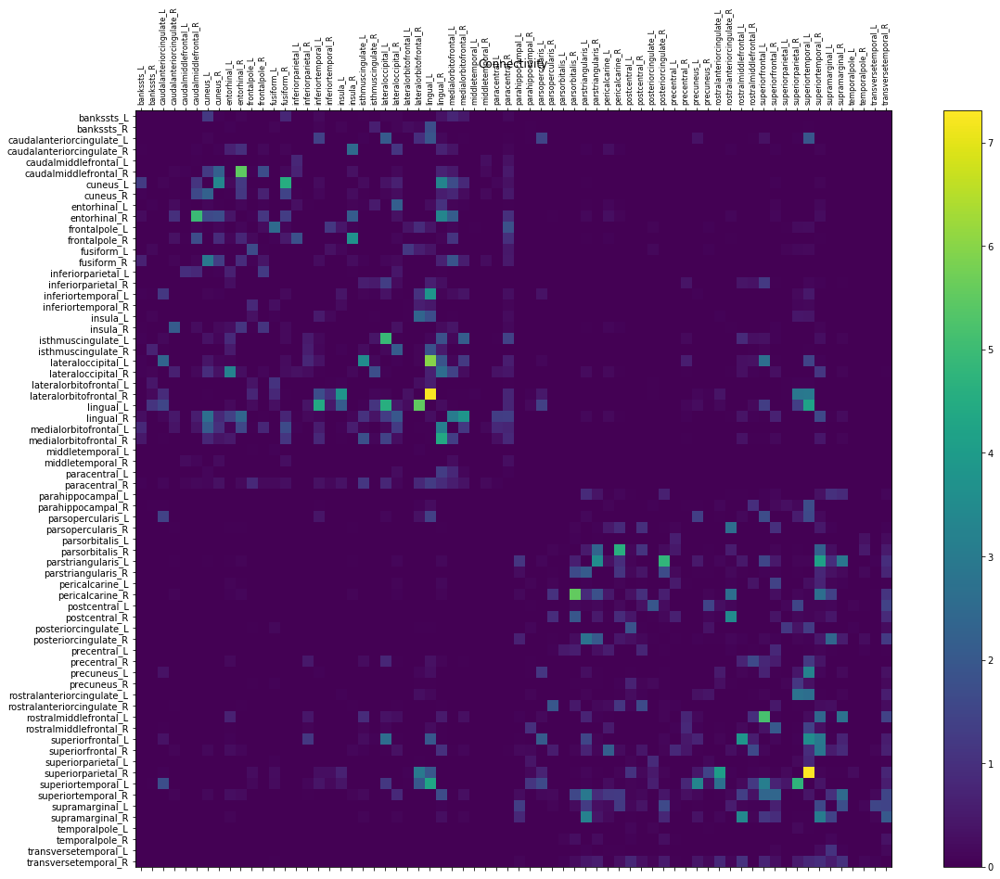

2020-04-01 19:08:29,012 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d645d5ba8>
2020-04-01 19:08:29,013 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-04-01 19:08:29,013 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d645d5ba8>
2020-04-01 19:08:29,014 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-04-01 19:08:29,118 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:29,119 - DEBUG - matplotlib.axes._base - not adjusting title pos because title was already placed manually: 1.050000
2020-04-01 19:08:29,411 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:29,526 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:29,527 - DEBUG - matplotlib.axes._base - title position was updated manually, not adjusting
2020-04-01 19:08:29,815 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:29,

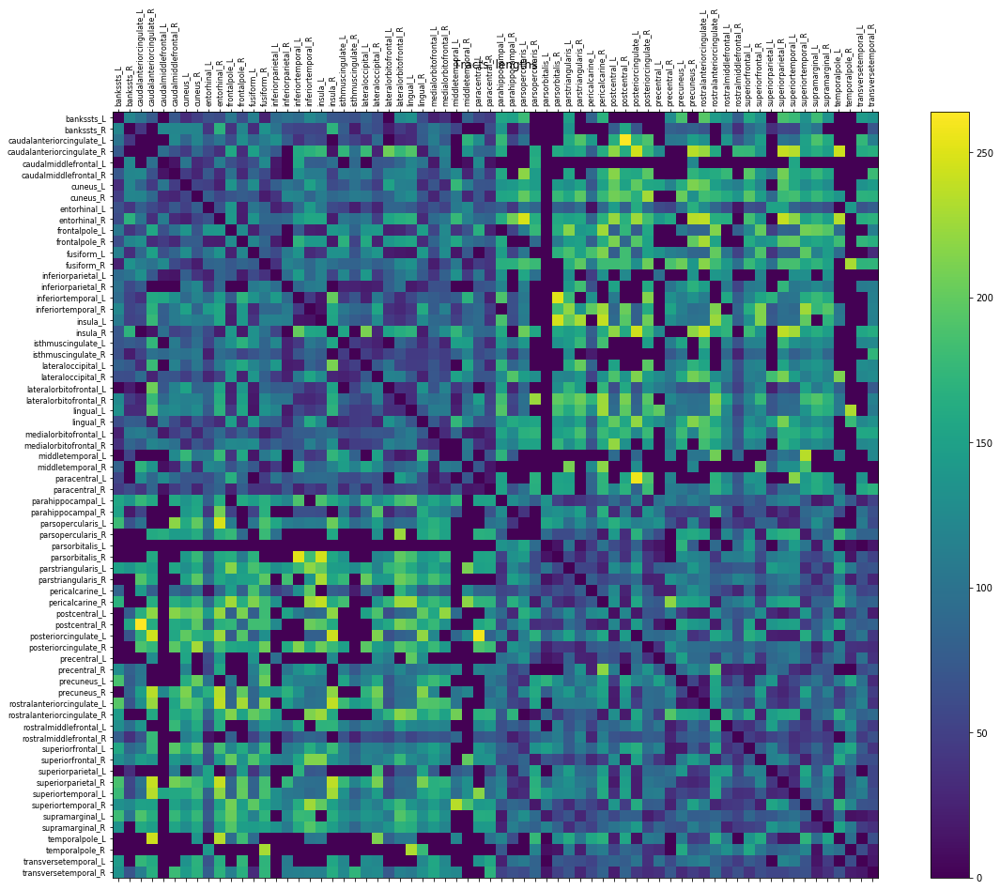

(<Figure size 1440x1080 with 2 Axes>,
 <Figure size 1440x1080 with 2 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f8d64232160>)

In [2]:
from tvb_multiscale.tvb.simulator_builder import SimulatorBuilder
from tvb.datatypes.connectivity import Connectivity
from tvb.simulator.models.reduced_wong_wang_exc_io_inh_i import ReducedWongWangExcIOInhI
from tvb.simulator.models.spiking_wong_wang_exc_io_inh_i import SpikingWongWangExcIOInhI
from tvb.simulator.models.multiscale_wong_wang_exc_io_inh_i import MultiscaleWongWangExcIOInhI

# Using the tvb-multdiscale simulator builder with default choices...
simulator_builder = SimulatorBuilder()
# Optionally modify the default configuration:
# simulator_builder.model = SpikingWongWangExcIOInhI
simulator_builder.model = MultiscaleWongWangExcIOInhI
simulator_builder.connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)

model_params = {
    "N_E": np.array([16,]),
    "N_I": np.array([4,]),
    "G":   np.array([2.0/10,])  # G / N_E to normalize for the order of the spiking networks
}
    
simulator = simulator_builder.build(**model_params)

# #--------------------------------------------------------------------------------------------
# # or in more detail...:
# from tvb.simulator.simulator import Simulator
# from tvb.simulator.integrators import HeunStochastic
# from tvb.simulator.monitors import Raw  # , Bold, EEG

# simulator = Simulator()

# simulator.connectivity = Connectivity.from_file(config.DEFAULT_CONNECTIVITY_ZIP)

# simulator.model = SpikingWongWangExcIOInhI()

# simulator.model.number_of_modes = 2

# dummy = np.ones((simulator.connectivity.number_of_regions, 2))


# simulator.integrator = HeunStochastic()
# simulator.integrator.dt = 0.1
# simulator.integrator.noise.nsig = np.array([0.001])

# mon_raw = Raw(period=simulator.integrator.dt)
# # Some extra monitors for neuroimaging measures:
# # mon_bold = Bold(period=2000.)
# # mon_eeg = EEG(period=1.0)
# simulator.monitors = (mon_raw, )  # mon_bold, mon_eeg
# #--------------------------------------------------------------------------------------------

if isinstance(simulator.model, MultiscaleWongWangExcIOInhI):
    # Some code only for MultiscaleWongWangExcIOInhI
    # Select the regions for the fine scale modeling with NEST spiking networks
    spiking_regions_inds = []  # the indices of fine scale regions modeled with NEST
    # In this example, we model parahippocampal cortices (left and right) with NEST
    for id, label in enumerate(simulator.connectivity.region_labels):
        if label.find("hippo") > 0:
            spiking_regions_inds.append(id)
    simulator.model._spiking_regions_inds = spiking_regions_inds
else:
    spiking_regions_inds = list(range(simulator.connectivity.number_of_regions))
    
if isinstance(simulator.model, SpikingWongWangExcIOInhI):
    # Some code only for SpikingWongWangExcIOInhI & MultiscaleWongWangExcIOInhI
    simulator.integrator.noise.nsig = np.array(simulator.model.nvar * [simulator.integrator.noise.nsig[0]])
    # No noise for t_ref and derived variables
    simulator.integrator.noise.nsig[5:] = 0.0  
else:
    # No noise for derived R_e, R_i of ReducedWongWangExcIOInhI
    simulator.integrator.noise.nsig[2:] = 0.0  

plotter.plot_tvb_connectivity(simulator.connectivity)

## 2. Configure simulator, simulate, gather results

In [3]:
# Configure the simulator interface...
simulator.configure()
# ...and simulate!
t = time.time()
results = simulator.run(simulation_length=100.0)
print("\nSimulated in %f secs!" % (time.time() - t))

...100.0% done in 20.1 sec
Simulated in 20.180210 secs!


In [4]:
# Gather the results
t = results[0][0]
source = results[0][1]

# Put the results in a Timeseries instance
from tvb_scripts.datatypes.time_series import TimeSeriesRegion

source_ts = TimeSeriesRegion(source, time=t,
               connectivity=simulator.connectivity,
               labels_ordering=["Time", "State Variable", "Region", "Neurons"],
               labels_dimensions=
                    {"State Variable": simulator.model.state_variables,
                     "Region": simulator.connectivity.region_labels.tolist()},
               sample_period=simulator.integrator.dt)
source_ts.configure()
source_ts 

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Neurons']"
Length,100.0
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: e66a43fc-faaa-421b-bcbd-6185ca0e0670
Time units,ms
Time-series name,TimeSeriesRegion gid: dcb20523-005d-4457-87ba-872c19c55837
Time-series type,TimeSeriesRegion
"[min, median, max]","[-71.2812, 0, 499.976]"


In [5]:
# Separate mean field time series into different populations

from tvb_scripts.service.time_series_service import TimeSeriesService

ts_service = TimeSeriesService()

populations = ["Exhitatory", "Inhibitory"]
pop_sizes = [0] + [int(simulator.model.N_E[0]), simulator.model.number_of_modes]
mean_field = []
for i_pop, (pop_name, pop_size) in enumerate(zip(populations, pop_sizes[1:])):
    mean_field.append(
            ts_service.mean_across_dimension(
                source_ts.get_modes_by_index(
                    np.arange(pop_sizes[i_pop], pop_size).astype("i")),
                3)
    )

    mean_field[-1].title = "Region mean field time series of %s population" % pop_name

mean_field = ts_service.concatenate_modes(mean_field)
try:
    del mean_field.labels_dimensions[source_ts.labels_ordering[3]]
except:
    pass
mean_field.labels_ordering[3] = "Population"
mean_field.labels_dimensions["Population"] = np.array(populations)
mean_field.title = "Region mean field time series"
print(mean_field)


# Separate spikes timeseries into two different populations:
source_spikes = source_ts.get_state_variables("spikes"). \
                        get_subspace_by_index(spiking_regions_inds)
spikes = []
for i_pop, (pop_name, pop_size) in enumerate(zip(populations, pop_sizes[1:])):
    spikes.append(
            source_spikes.get_modes_by_index(
                np.arange(pop_sizes[i_pop], pop_size).astype("i")))
    spikes[-1].title = "Region spikes' time series of %s population" % pop_name
    try:
        del spikes[-1].labels_dimensions['State Variable']
    except:
        pass
    spikes[-1].labels_ordering[1] = "Population"
    spikes[-1].labels_dimensions['Population'] = np.array([pop_name])
print([print(spike) for spike in spikes])


# Compute spike rates
if "rate" not in mean_field.labels_dimensions["State Variable"]:
    rate = []
    for i_pop, spike_ts in enumerate(ensure_list(spikes)):
        rate.append(ts_service.sum_across_dimension(spike_ts, 3) / dt * 1000)
        try:
            del rate[-1].labels_dimensions[source_ts.labels_ordering[3]]
        except:
            pass
        rate[-1].labels_ordering[3] = "Mode"
        rate[-1].title = "Spike rate"
    rate = ts_service.concatenate_variables(rate)
else:
    mean_field[:, "rate", spiking_regions_inds, :] /= (simulator.integrator.dt * 0.001)  # rate in Hz
    rate = mean_field.get_state_variables("rate").get_subspace_by_index(spiking_regions_inds)
    rate = rate.swapaxes(1, 3)  # Swap "State Variable" with "Population"
    try:
        del rate.labels_dimensions["State Variable"]
    except:
        pass
    rate.labels_ordering[3] = "Mode"
    rate.title = "Region mean field spike rate time series"


rate.title = "Region mean field spike rate time series"
print(rate)


2020-04-01 19:08:54,416 - WARNING - tvb_scripts.time_series.model - Failed to get labels subset for indices [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15] of dimension 3!
2020-04-01 19:08:54,416 - WARNING - tvb_scripts.time_series.model - Failed to get labels subset for indices [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15] of dimension 3!
2020-04-01 19:08:54,596 - WARNING - tvb_scripts.time_series.model - Failed to get labels subset for indices [16, 17, 18, 19] of dimension 3!
2020-04-01 19:08:54,596 - WARNING - tvb_scripts.time_series.model - Failed to get labels subset for indices [16, 17, 18, 19] of dimension 3!
TimeSeriesRegion (
  Dimensions .......... ['Time', 'State Variable', 'Region', 'Population']
  Length .............. 100.0
  Region Mapping ...... None
  Region Mapping Volume  None
  Sample period ....... 0.1
  Source Connectivity . Connectivity gid: e66a43fc-faaa-421b-bcbd-6185ca0e0670
  Time units .......... ms
  Time-series name .... Region mean field t

2020-04-01 19:08:54,922 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:55,321 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:55,535 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:55,878 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:56,133 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:56,297 - DEBUG - matplotlib.axes._base - update_title_pos


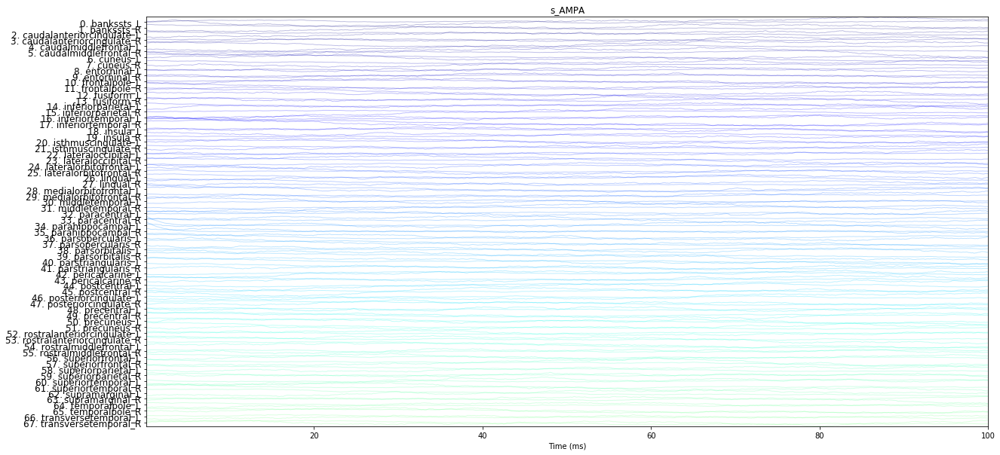

2020-04-01 19:08:56,843 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:57,186 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:08:57,382 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:57,668 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:57,921 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:58,093 - DEBUG - matplotlib.axes._base - update_title_pos


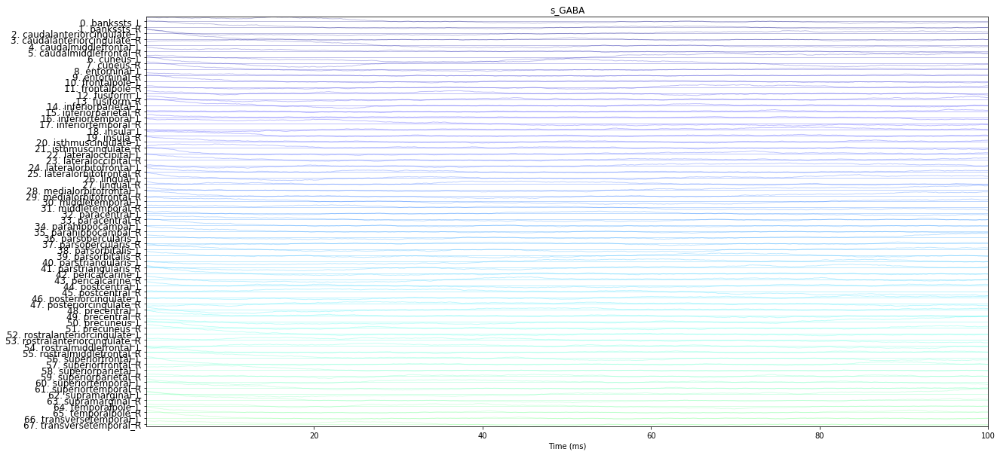

2020-04-01 19:08:58,521 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:58,934 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:08:59,146 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:59,503 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:59,754 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:08:59,924 - DEBUG - matplotlib.axes._base - update_title_pos


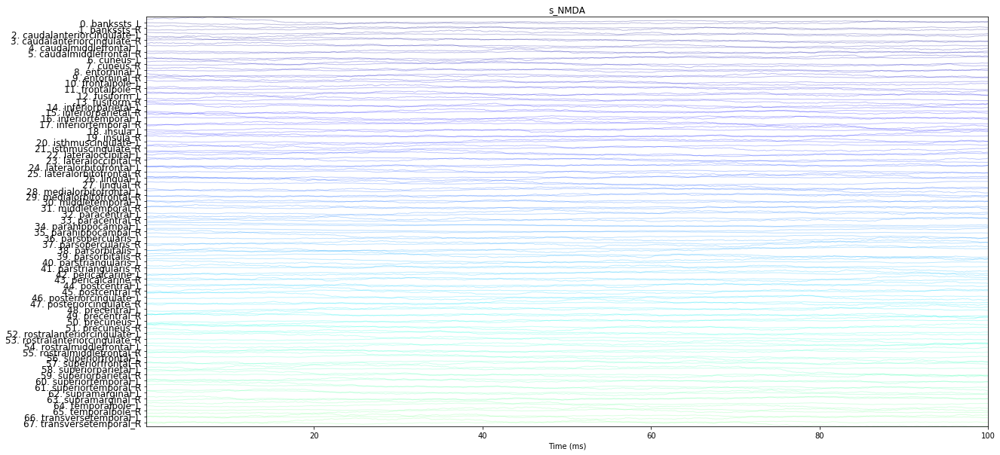

2020-04-01 19:09:00,407 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:00,654 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:00,834 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:01,075 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:01,328 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:01,492 - DEBUG - matplotlib.axes._base - update_title_pos


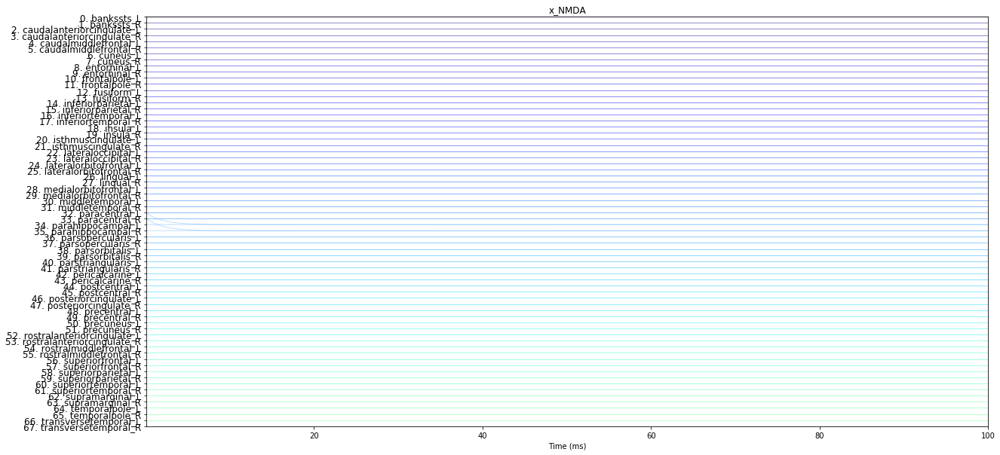

2020-04-01 19:09:01,867 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:02,115 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:02,295 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:02,524 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:02,859 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:03,033 - DEBUG - matplotlib.axes._base - update_title_pos


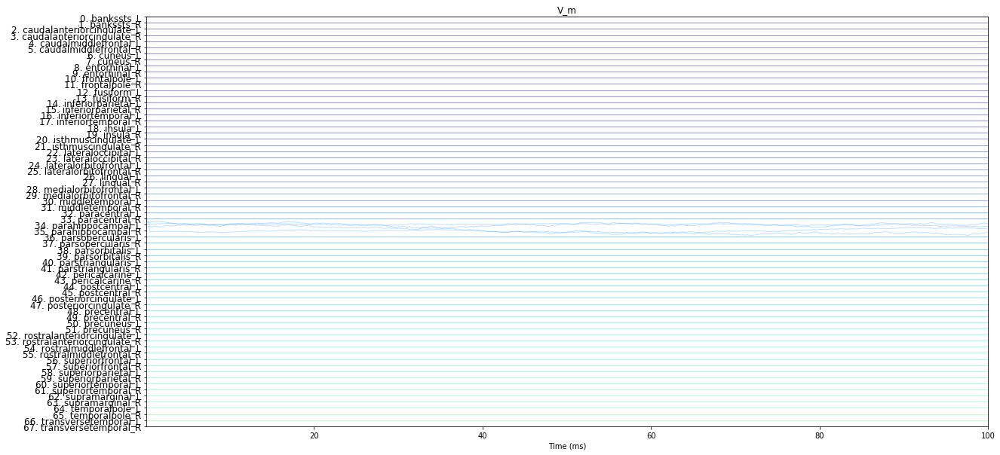

2020-04-01 19:09:03,408 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:03,650 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:03,829 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:04,058 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:04,315 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:04,485 - DEBUG - matplotlib.axes._base - update_title_pos


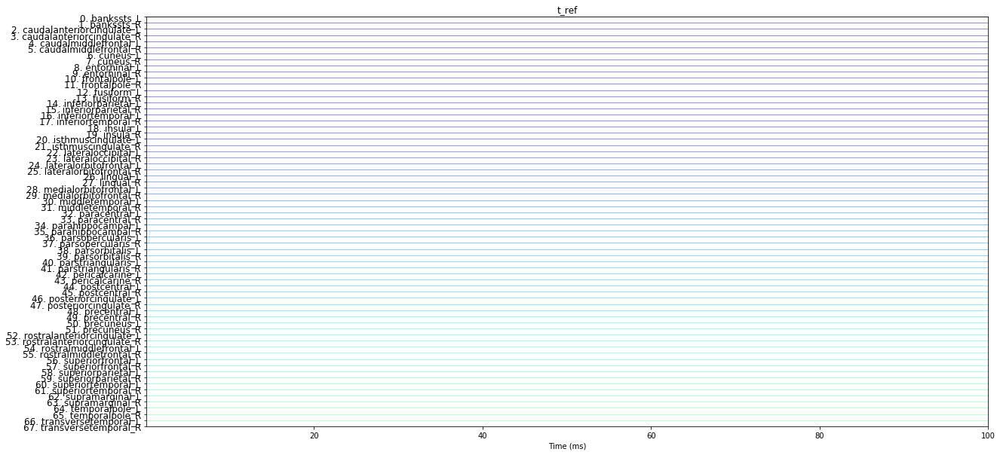

2020-04-01 19:09:04,842 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:05,082 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:05,261 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:05,493 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:05,749 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:05,920 - DEBUG - matplotlib.axes._base - update_title_pos


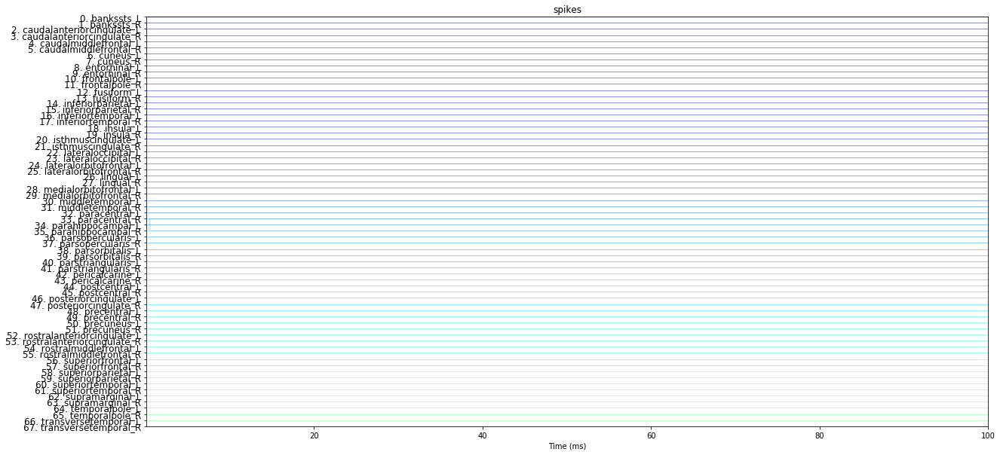

2020-04-01 19:09:06,284 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:06,659 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:06,869 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:07,206 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:07,464 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:07,631 - DEBUG - matplotlib.axes._base - update_title_pos


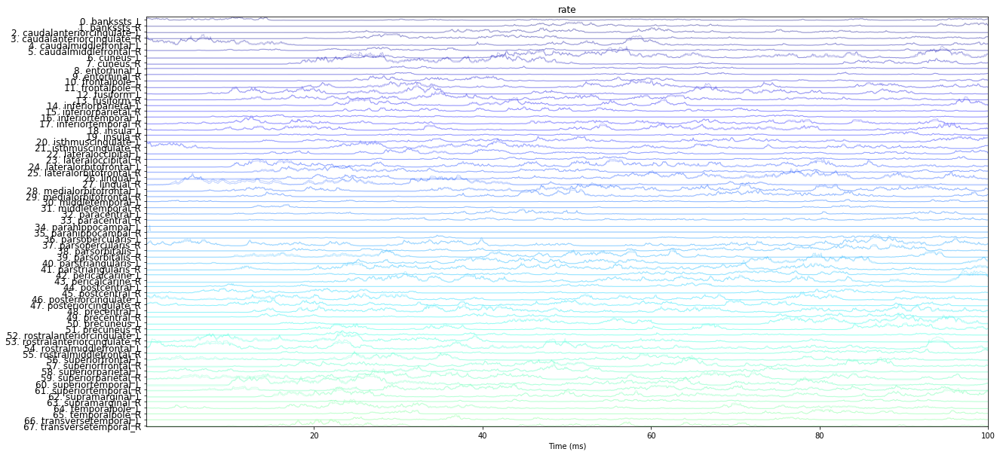

2020-04-01 19:09:08,093 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:08,343 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:08,521 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:08,754 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:09,105 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:09,288 - DEBUG - matplotlib.axes._base - update_title_pos


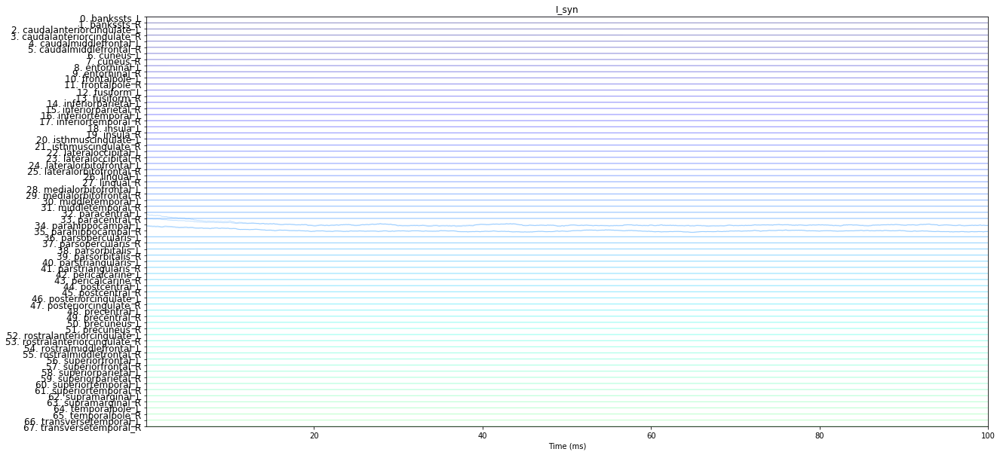

2020-04-01 19:09:09,655 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:09,897 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:10,073 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:10,299 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:10,552 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:10,718 - DEBUG - matplotlib.axes._base - update_title_pos


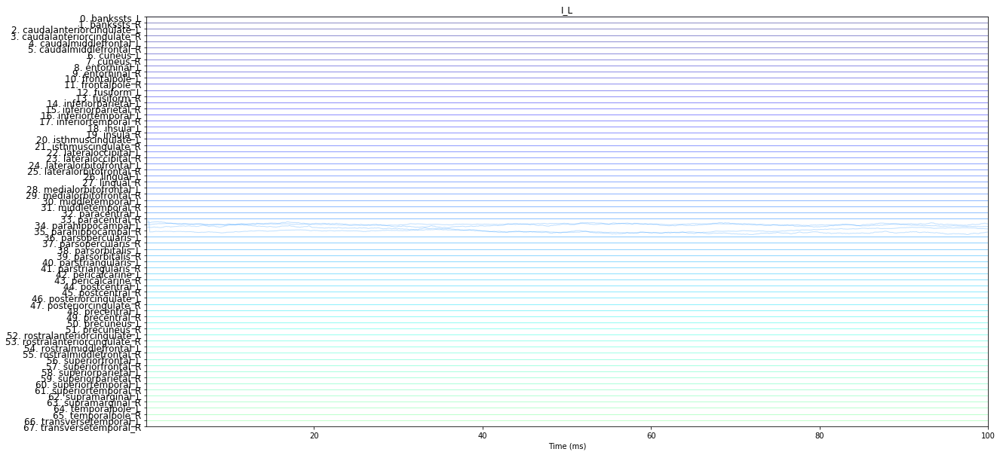

2020-04-01 19:09:11,100 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:11,351 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:11,532 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:11,763 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:12,013 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:12,181 - DEBUG - matplotlib.axes._base - update_title_pos


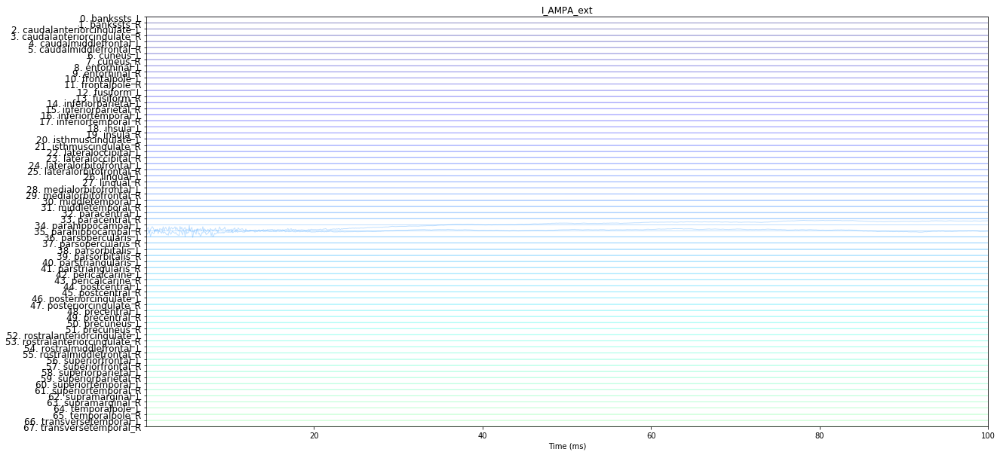

2020-04-01 19:09:12,540 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:12,786 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:12,959 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:13,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:13,459 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:13,621 - DEBUG - matplotlib.axes._base - update_title_pos


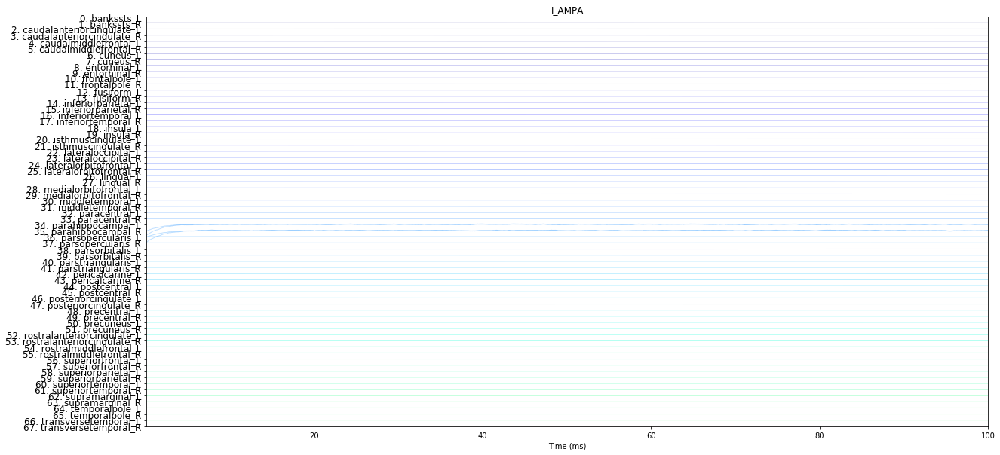

2020-04-01 19:09:13,983 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:14,231 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:14,406 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:14,639 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:14,986 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:15,156 - DEBUG - matplotlib.axes._base - update_title_pos


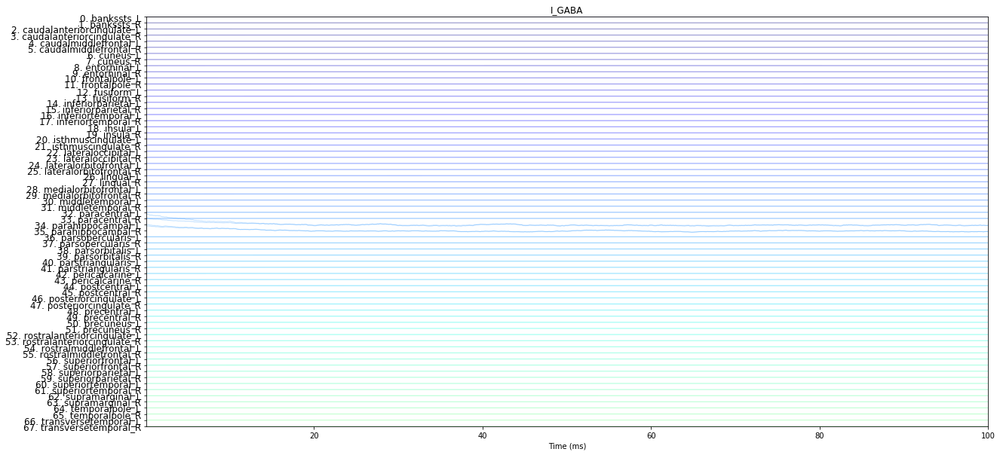

2020-04-01 19:09:15,540 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:15,790 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:15,964 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:16,196 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:16,453 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:16,619 - DEBUG - matplotlib.axes._base - update_title_pos


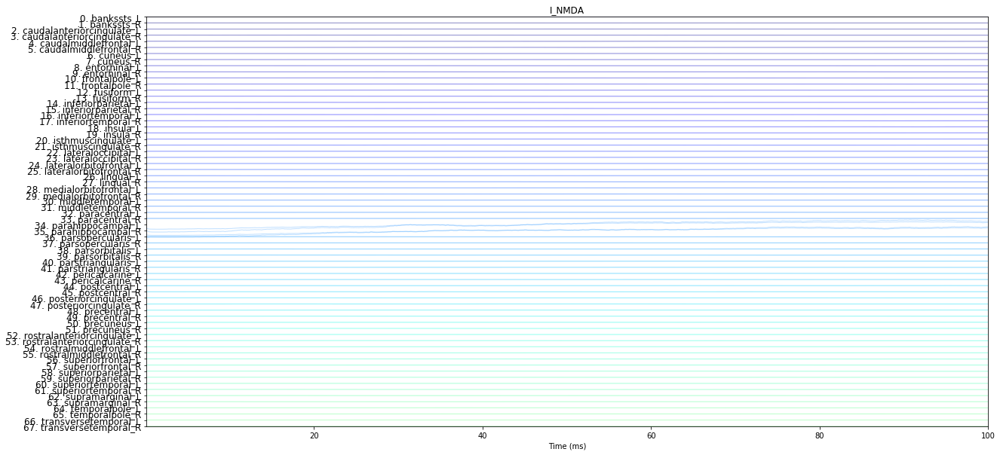

<Figure size 432x288 with 0 Axes>

In [6]:
# For raster plot:
for sv in source_ts.variables_labels:
    plotter.plot_raster(mean_field.get_state_variables(sv), 
                        title="Mean field region %s Time Series Raster" % sv, figsize=config.figures.NOTEBOOK_SIZE);
    

2020-04-01 19:09:16,979 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:17,316 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:17,459 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:17,734 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:17,794 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:17,845 - DEBUG - matplotlib.axes._base - update_title_pos


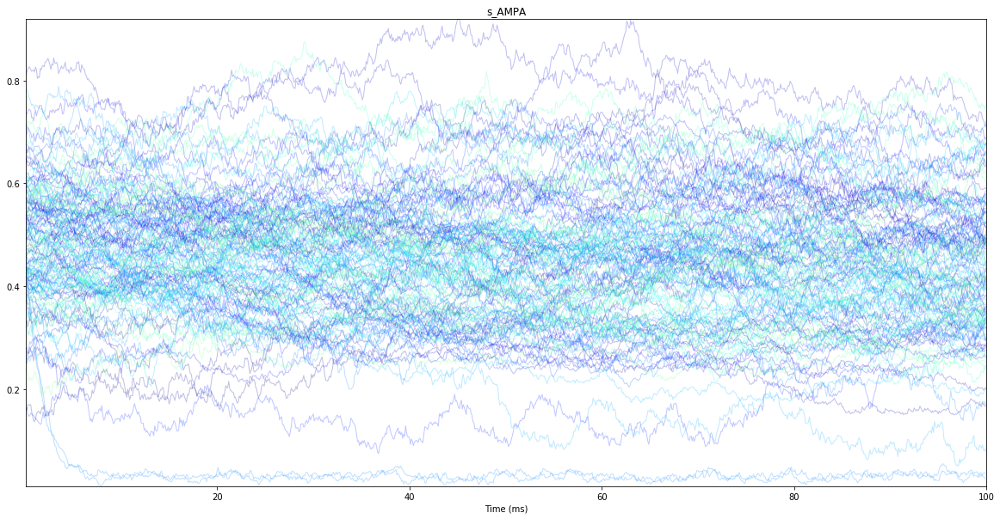

2020-04-01 19:09:18,274 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:18,611 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:18,715 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:18,959 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:19,029 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:19,066 - DEBUG - matplotlib.axes._base - update_title_pos


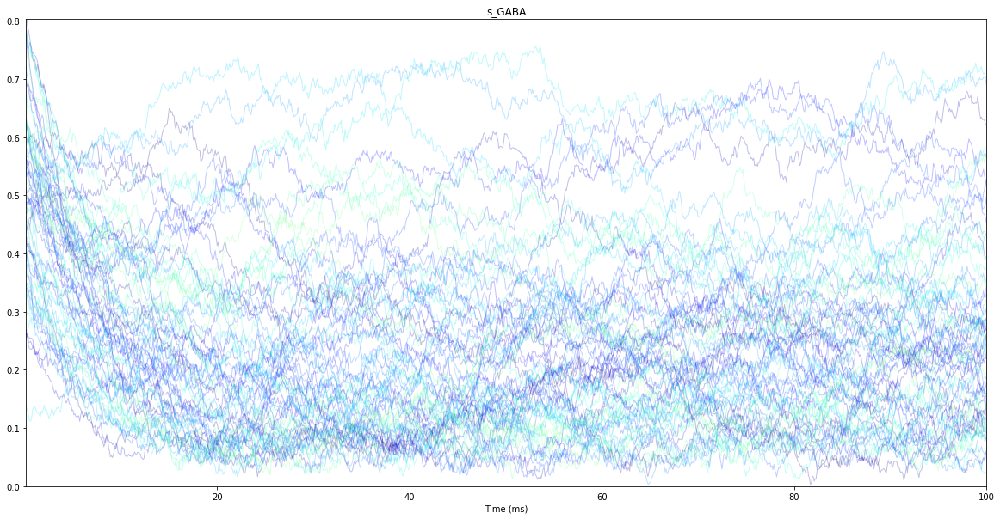

2020-04-01 19:09:19,442 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:19,922 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:20,085 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:20,448 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:20,509 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:20,558 - DEBUG - matplotlib.axes._base - update_title_pos


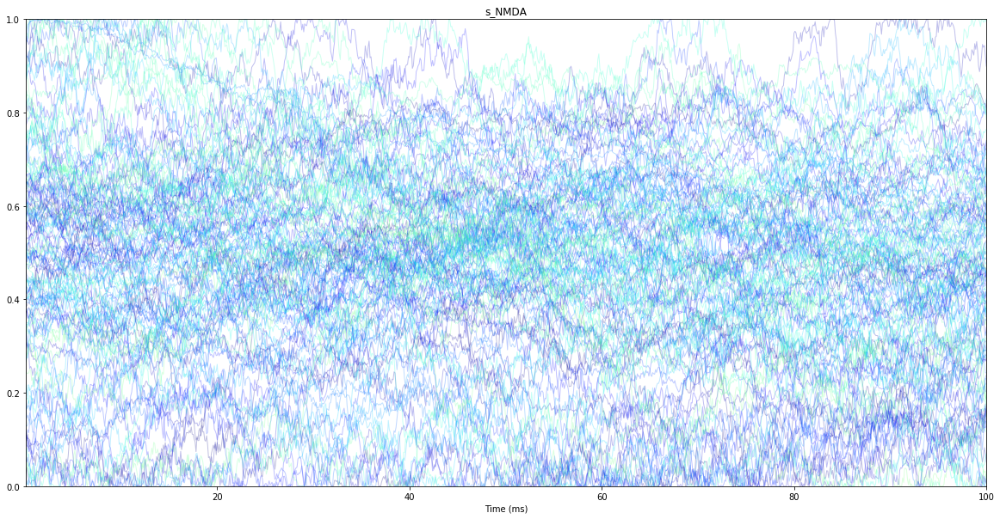

2020-04-01 19:09:21,063 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,185 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:21,226 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,315 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,396 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,434 - DEBUG - matplotlib.axes._base - update_title_pos


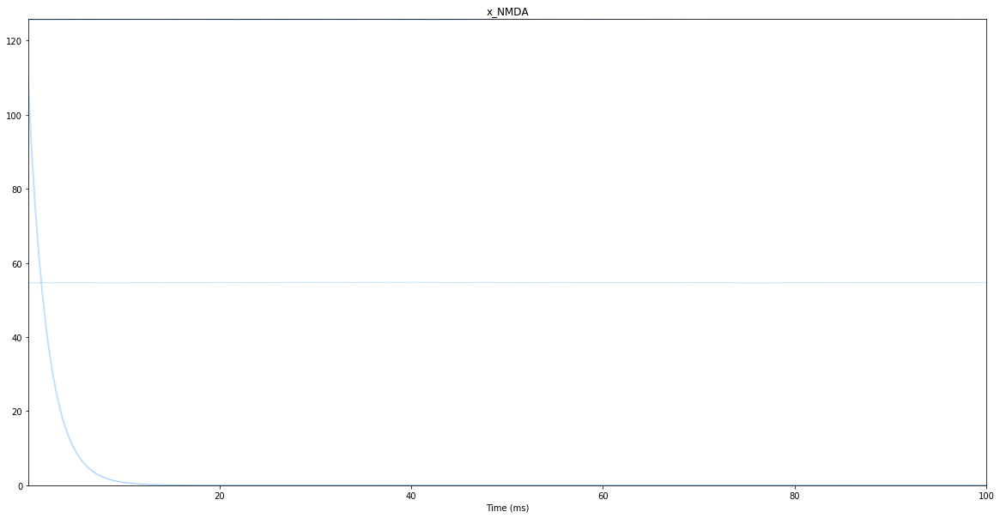

2020-04-01 19:09:21,711 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,831 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:21,882 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:21,978 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,057 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,103 - DEBUG - matplotlib.axes._base - update_title_pos


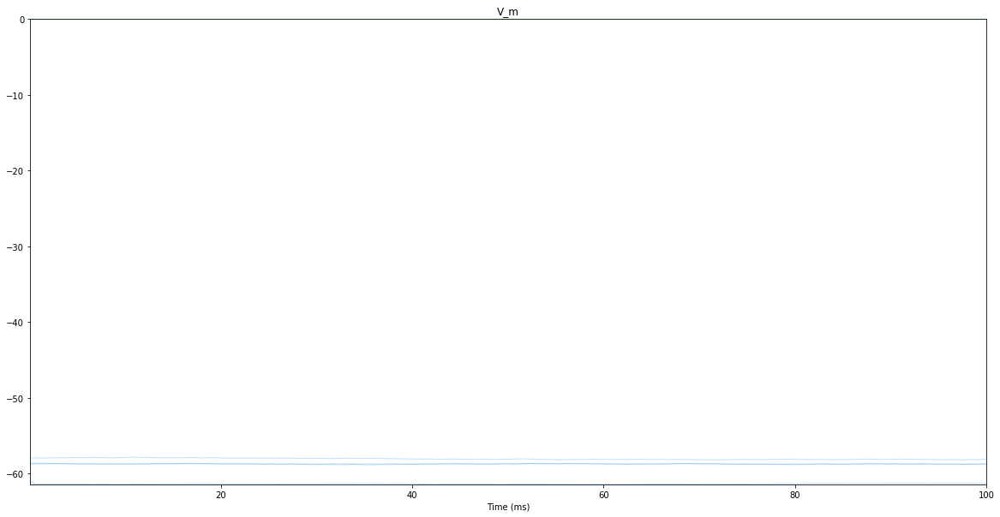

2020-04-01 19:09:22,300 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,410 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:22,460 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,555 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,635 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,676 - DEBUG - matplotlib.axes._base - update_title_pos


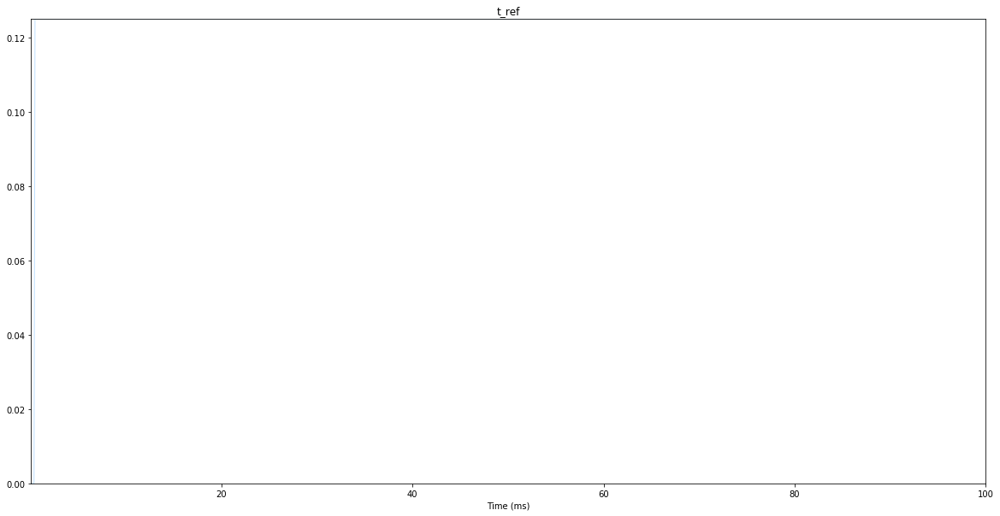

2020-04-01 19:09:22,872 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:22,978 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:23,026 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:23,123 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:23,188 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:23,229 - DEBUG - matplotlib.axes._base - update_title_pos


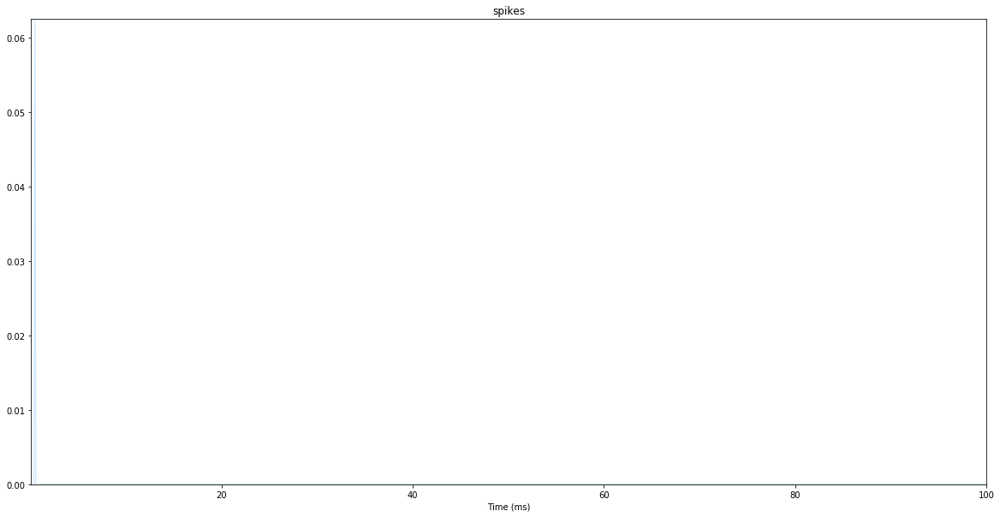

2020-04-01 19:09:23,427 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:23,984 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:24,201 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:24,611 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:24,676 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:24,718 - DEBUG - matplotlib.axes._base - update_title_pos


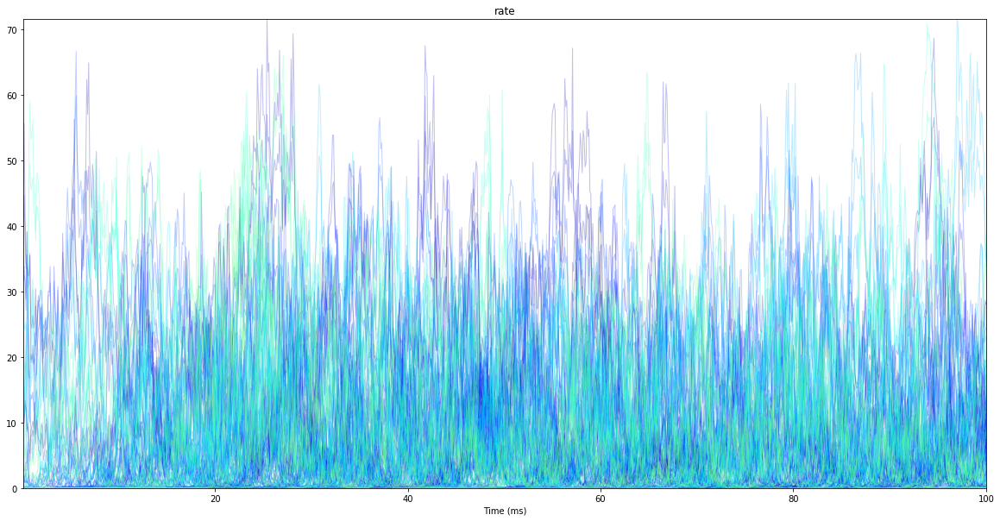

2020-04-01 19:09:25,264 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:25,400 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:25,461 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:25,575 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:25,653 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:25,692 - DEBUG - matplotlib.axes._base - update_title_pos


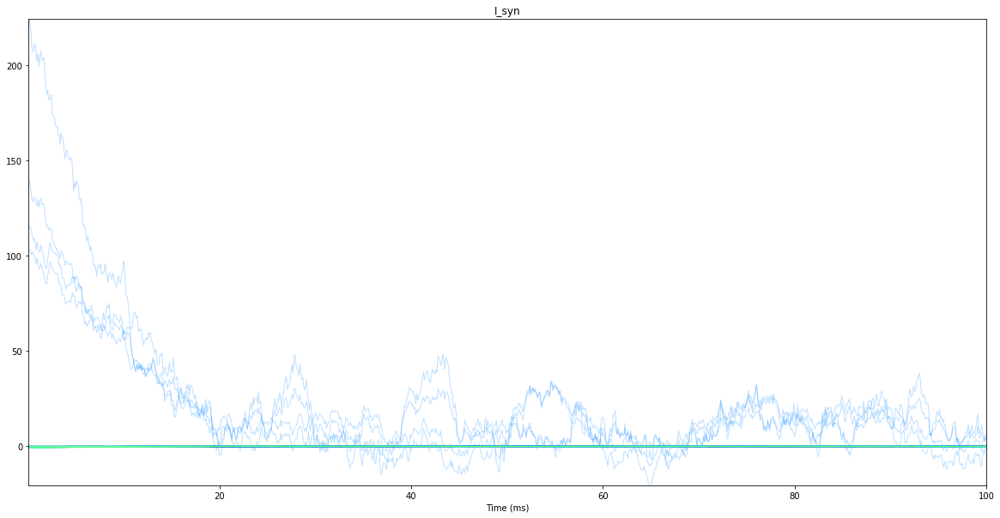

2020-04-01 19:09:25,911 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,021 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:26,070 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,174 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,249 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,294 - DEBUG - matplotlib.axes._base - update_title_pos


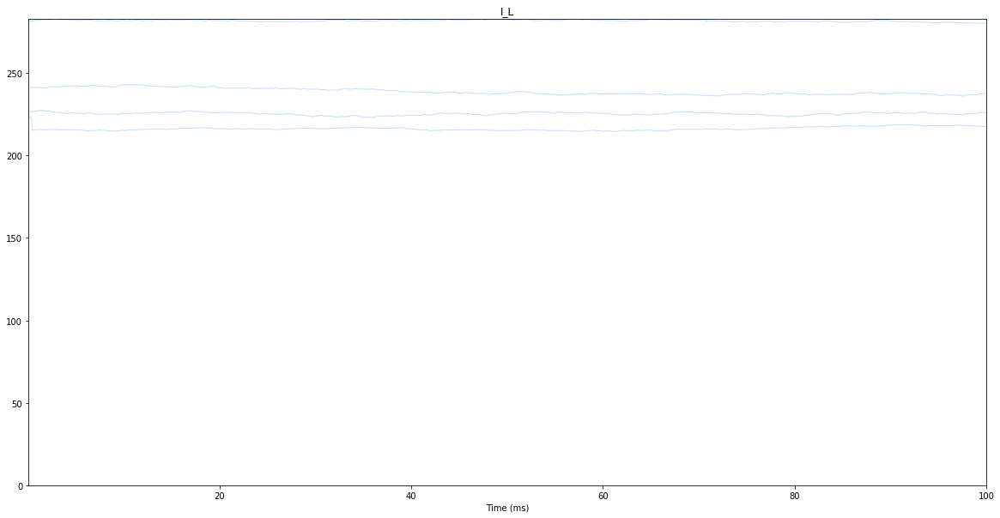

2020-04-01 19:09:26,568 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,708 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:26,757 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,859 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,933 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:26,984 - DEBUG - matplotlib.axes._base - update_title_pos


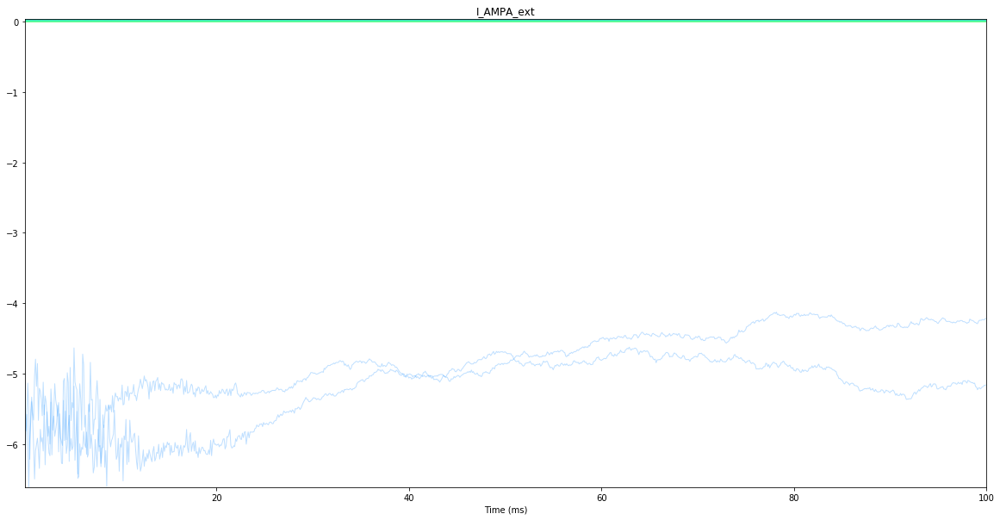

2020-04-01 19:09:27,194 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:27,340 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:27,410 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:27,527 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:27,592 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:27,641 - DEBUG - matplotlib.axes._base - update_title_pos


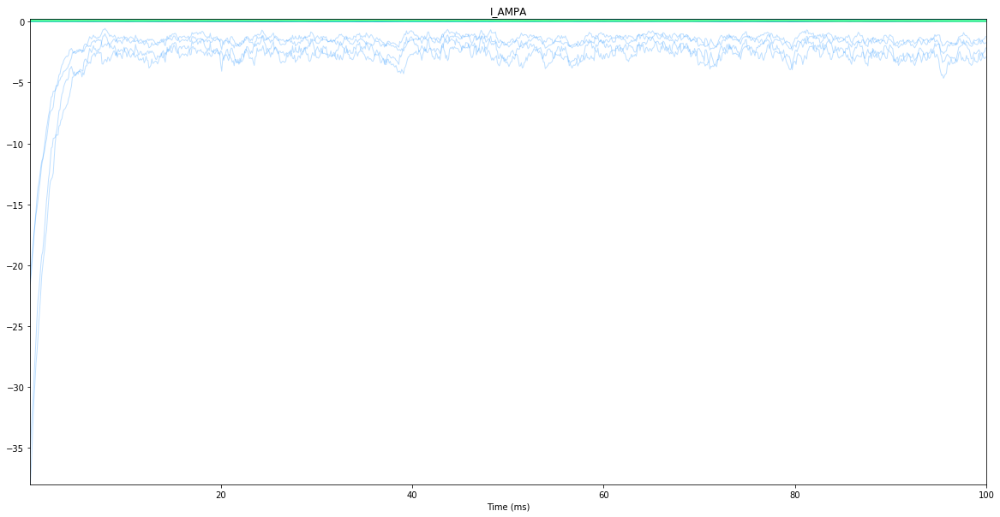

2020-04-01 19:09:27,862 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,001 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:28,070 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,185 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,264 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,310 - DEBUG - matplotlib.axes._base - update_title_pos


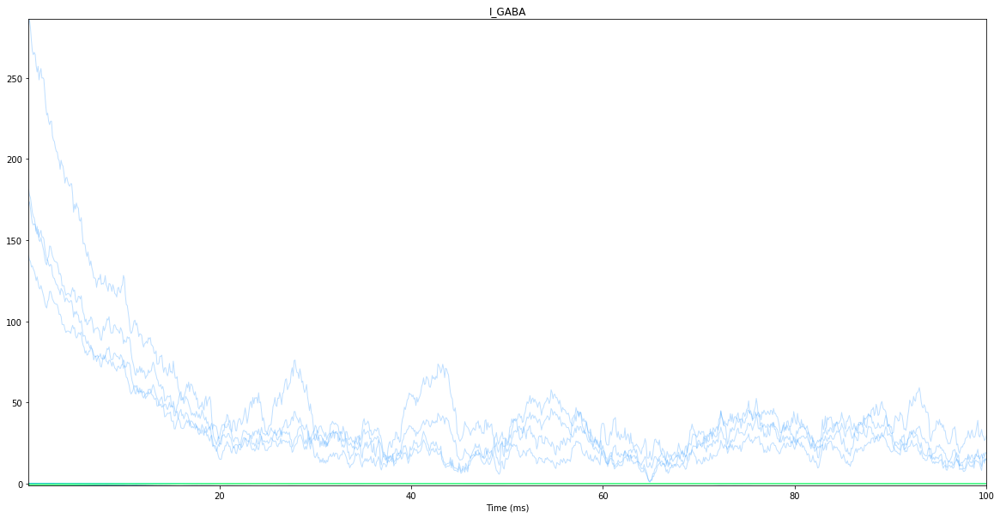

2020-04-01 19:09:28,534 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,672 - DEBUG - matplotlib.axes._base - update_title_pos


<Figure size 432x288 with 0 Axes>

2020-04-01 19:09:28,748 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,859 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,931 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:28,977 - DEBUG - matplotlib.axes._base - update_title_pos


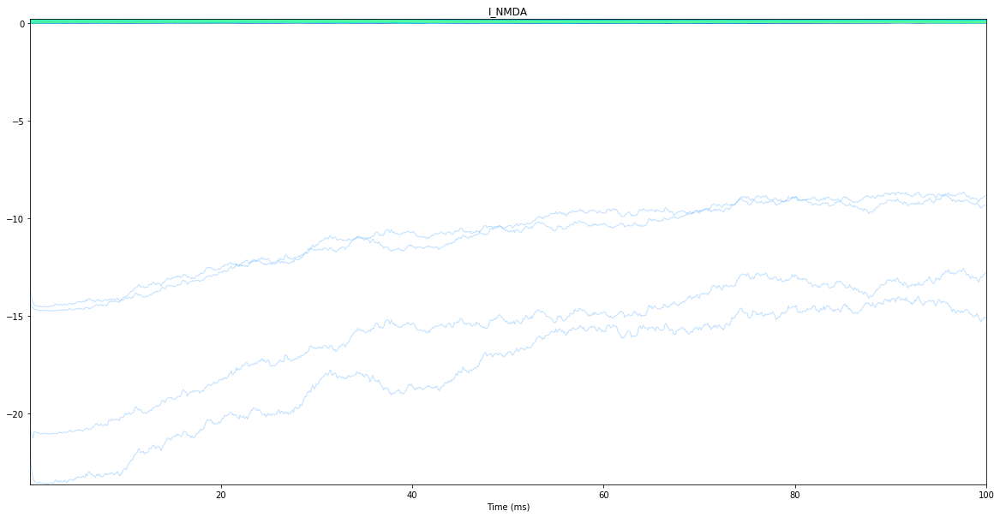

<Figure size 432x288 with 0 Axes>

In [7]:
# For timeseries plot:
for sv in source_ts.variables_labels:
    plotter.plot_timeseries(mean_field.get_state_variables(sv), 
                            title="Mean field region %s Time Series" % sv, figsize=config.figures.NOTEBOOK_SIZE);


### Interactive time series plot

In [8]:
# # ...interactively as well
# # For interactive plotting:
# %matplotlib notebook 
# plotter.plot_timeseries_interactive(source_ts)

In [9]:
%matplotlib inline 

2020-04-01 19:09:29,106 - DEBUG - matplotlib.pyplot - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


### Plot spikes' raster and mean spike rate for spiking regions

2020-04-01 19:09:29,236 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,258 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,280 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,294 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,399 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,418 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,433 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,444 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,465 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,479 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,498 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,511 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,595 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:29,607 -

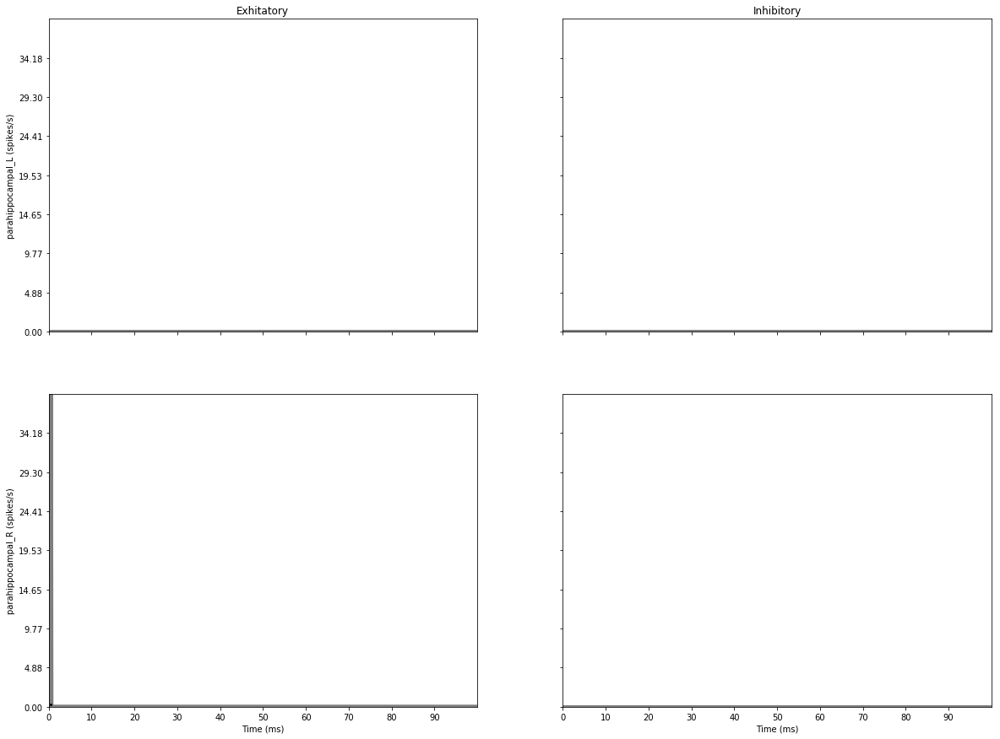

(<Figure size 432x288 with 0 Axes>,
 [[<matplotlib.axes._subplots.AxesSubplot at 0x7f8d5d86f128>,
   <matplotlib.axes._subplots.AxesSubplot at 0x7f8d63ddeb00>]])

<Figure size 432x288 with 0 Axes>

In [10]:
# Plot spikes and mean field spike rates
plotter.plot_spikes(spikes, rates=rate, title='Population spikes and mean spike rate')

### Plotting spiking network activity using xarray

In [11]:
mean_field.get_subspace(spiking_regions_inds)

,value
Dimensions,"['Time', 'State Variable', 'Region', 'Population']"
Length,100.0
Region Mapping,None
Region Mapping Volume,None
Sample period,0.1
Source Connectivity,Connectivity gid: e66a43fc-faaa-421b-bcbd-6185ca0e0670
Time units,ms
Time-series name,Region mean field time series
Time-series type,TimeSeriesRegion
"[min, median, max]","[-61.4211, 0, 286.192]"


In [12]:
from tvb_scripts.datatypes.time_series_xarray import TimeSeries as TimeSeriesXarray

mean_field_xr = TimeSeriesXarray(mean_field.get_subspace(spiking_regions_inds))
print(mean_field_xr)
rate_xr = TimeSeriesXarray(rate)
print(rate_xr)


TimeSeries (
  Dimensions ....... ['Time', 'State Variable', 'Region', 'Population']
  Length ........... 1000
  Sample period .... 0.1
  Time units ....... ms
  Time-series name . Region mean field time series
  Time-series type . TimeSeries
  [min, median, max]  [-61.4211, 0, 286.192]
  dtype ............ float64
  shape ............ (1000, 14, 2, 2)
)
TimeSeries (
  Dimensions ....... ['Time', 'Population', 'Region', 'Mode']
  Length ........... 1000
  Sample period .... 0.1
  Time units ....... ms
  Time-series name . Region mean field spike rate time series
  Time-series type . TimeSeries
  [min, median, max]  [0, 0, 39.0625]
  dtype ............ float64
  shape ............ (1000, 2, 2, 1)
)


2020-04-01 19:09:30,090 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,124 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,146 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,162 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,205 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,250 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,265 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,318 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,335 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,372 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,388 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,434 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,452 -

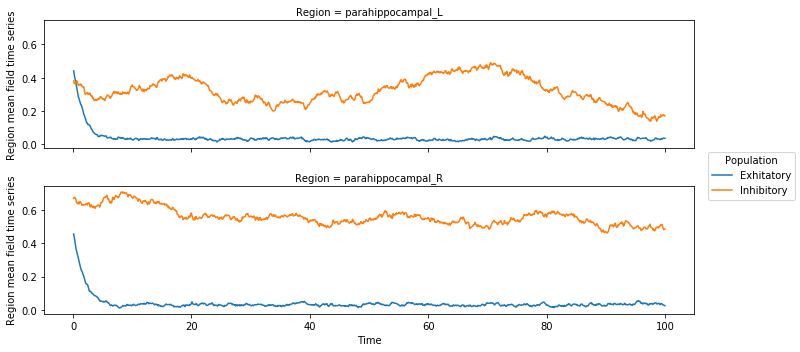

2020-04-01 19:09:30,682 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,715 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,739 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,758 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,786 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,806 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,845 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,860 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,913 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,929 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,967 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:30,980 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,022 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,050 -

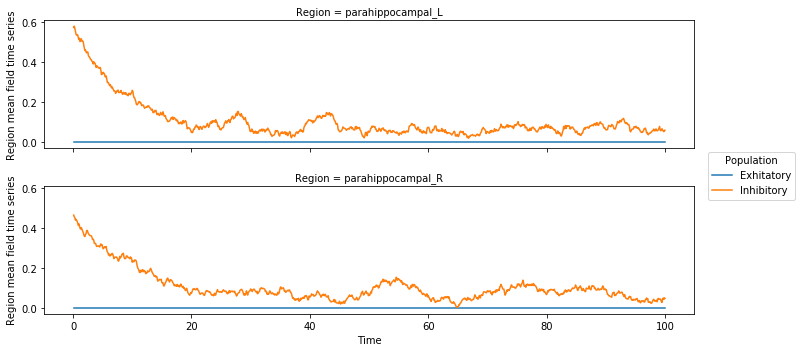

2020-04-01 19:09:31,284 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,315 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,338 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,358 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,388 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,412 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,454 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,472 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,529 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,549 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,588 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,606 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,653 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:31,678 -

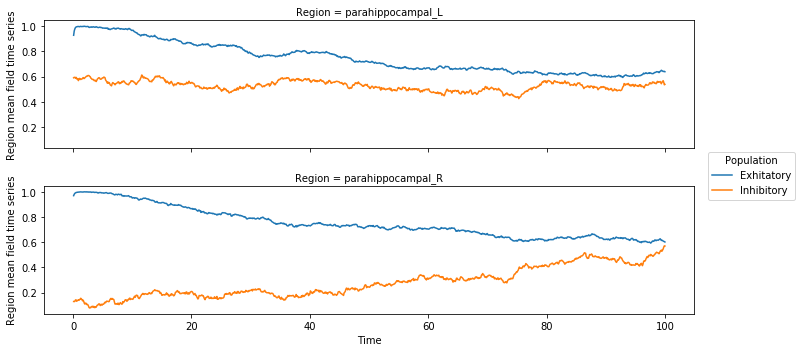

2020-04-01 19:09:31,993 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,027 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,051 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,069 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,097 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,115 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,155 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,173 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,238 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,280 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,297 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,340 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,361 -

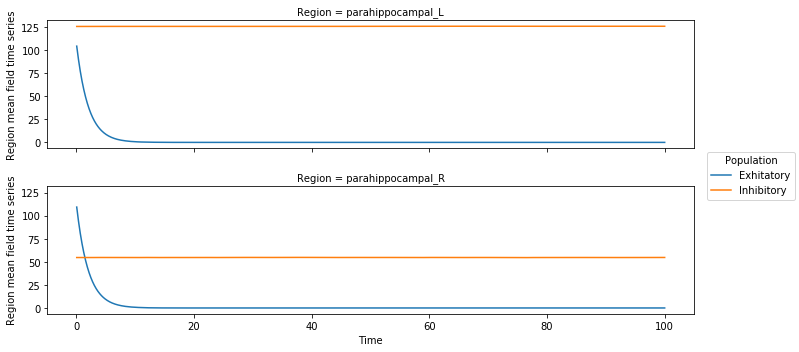

2020-04-01 19:09:32,595 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,635 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,665 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,683 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,713 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,732 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,770 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,790 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,839 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,854 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,891 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,906 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,951 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:32,970 -

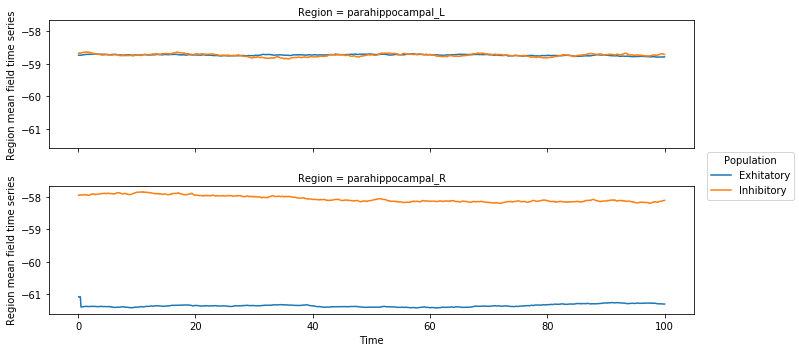

2020-04-01 19:09:33,198 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,228 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,250 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,268 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,292 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,317 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,360 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,376 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,426 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,445 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,486 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,506 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,548 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,567 -

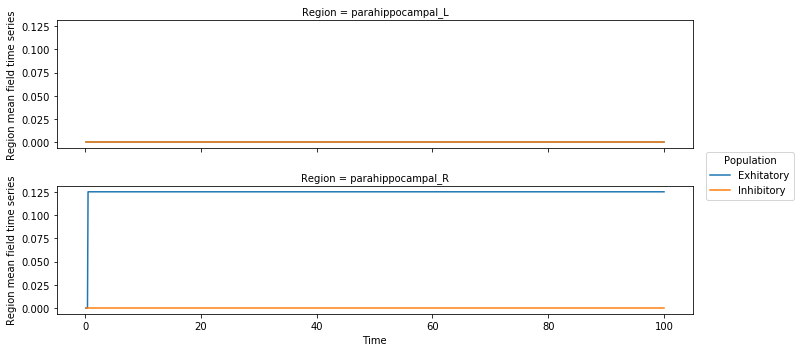

2020-04-01 19:09:33,800 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,833 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,852 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,870 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,899 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,916 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,960 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:33,977 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,023 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,040 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,080 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,096 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,134 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,150 -

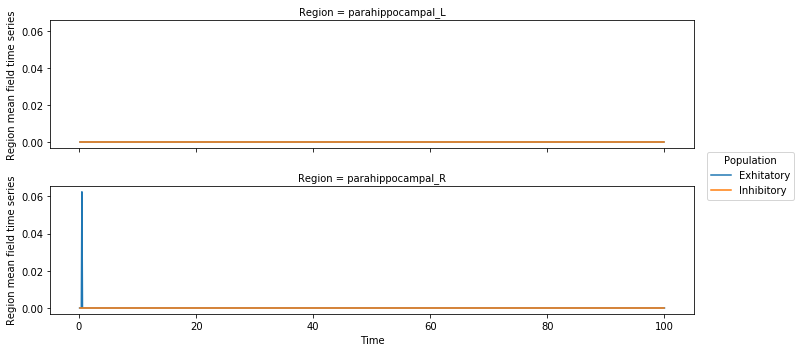

2020-04-01 19:09:34,364 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,403 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,431 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,448 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,476 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,493 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,532 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,547 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,590 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,607 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,642 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,659 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,702 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,719 -

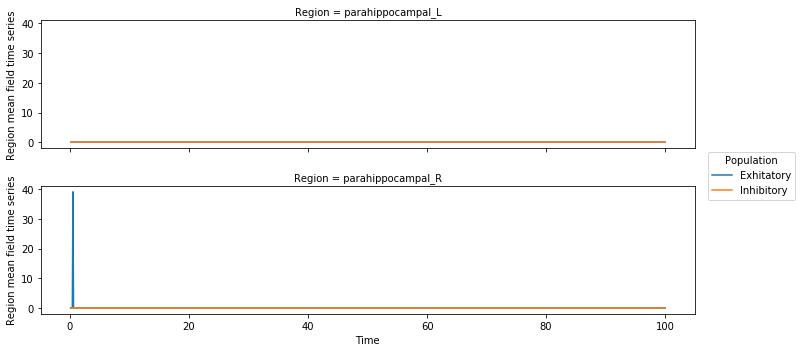

2020-04-01 19:09:34,942 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:34,981 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,007 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,028 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,057 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,075 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,124 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,142 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,200 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,220 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,260 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,278 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,320 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,343 -

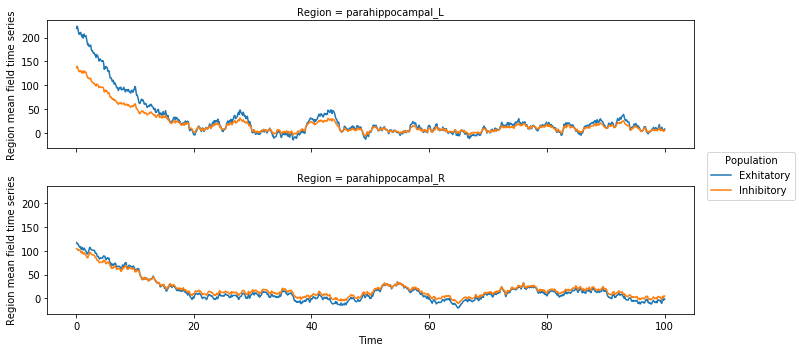

2020-04-01 19:09:35,572 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,605 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,625 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,644 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,671 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,688 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,726 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,744 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,792 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,809 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,849 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,864 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,905 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:35,923 -

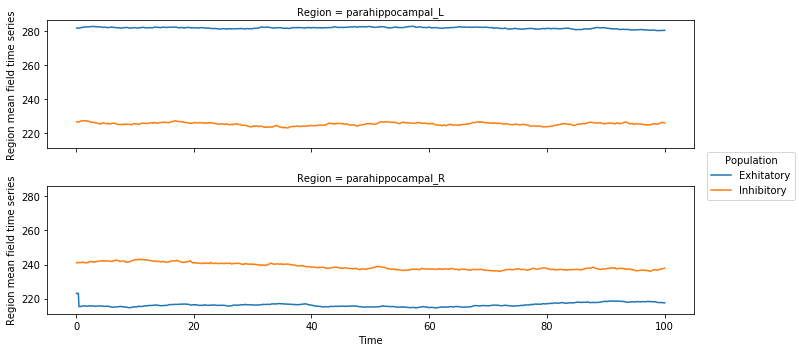

2020-04-01 19:09:36,170 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,202 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,229 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,246 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,272 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,292 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,329 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,343 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,389 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,407 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,446 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,462 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,500 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,524 -

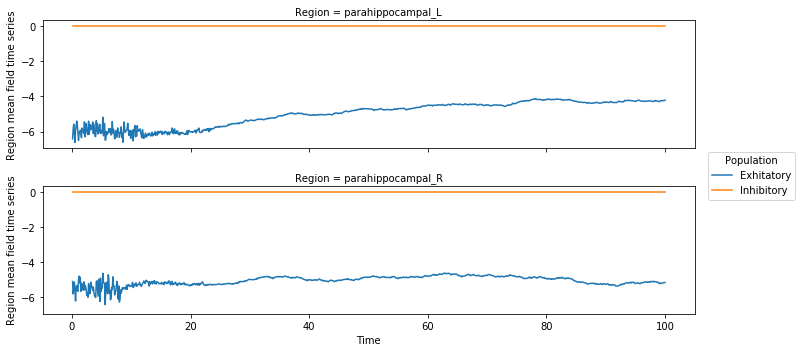

2020-04-01 19:09:36,797 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,824 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,844 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,862 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,884 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,901 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,943 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:36,955 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,007 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,027 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,096 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,127 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,186 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,202 -

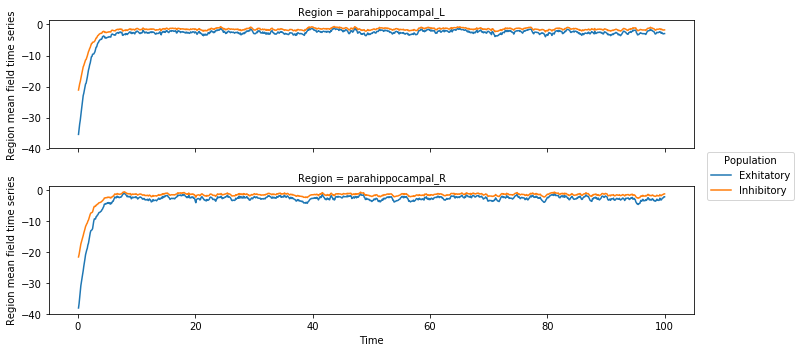

2020-04-01 19:09:37,413 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,446 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,466 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,485 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,508 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,527 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,565 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,578 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,626 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,645 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,681 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,702 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,743 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:37,760 -

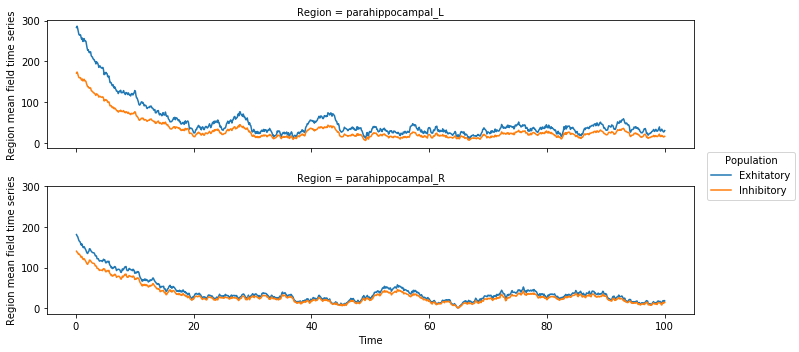

2020-04-01 19:09:37,973 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,007 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,027 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,045 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,068 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,084 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,133 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,163 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,268 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,322 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,420 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,448 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,521 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,548 -

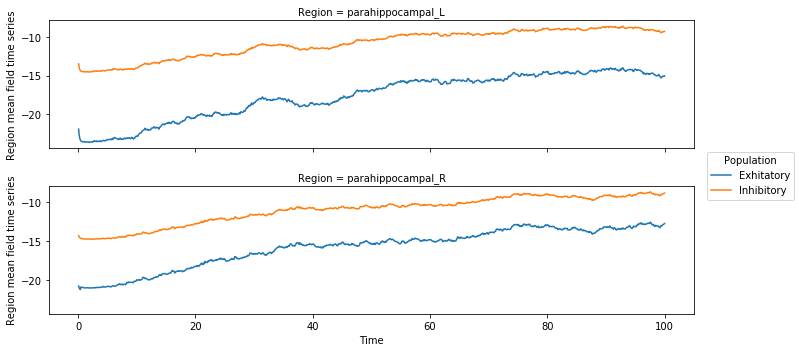

2020-04-01 19:09:38,776 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,825 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,863 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,896 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,936 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:38,983 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,045 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,075 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,128 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,155 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,198 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,228 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,275 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,315 -

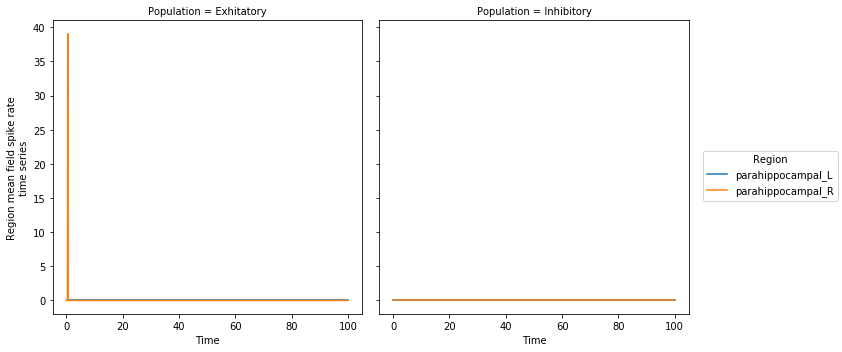

In [13]:
# ts.plot(plotter=plotter, )
mean_field_xr.plot_timeseries(plotter=plotter, per_variable=True, figsize=(10, 5))
rate_xr.plot_timeseries(plotter=plotter, figsize=(10, 5))

In [14]:
# mean_field_xr.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))
# mean_field_xr.plot_raster(plotter=plotter, per_variable=True, linestyle="--", alpha=1.0, linewidth=0.5, figsize=(10, 5))

### Plotting spiking network spiking activity using xarray

Region spikes' time series of Exhitatory population
2020-04-01 19:09:39,614 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,667 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,718 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d5d5150b8>
2020-04-01 19:09:39,720 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-04-01 19:09:39,722 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d5d5150b8>
2020-04-01 19:09:39,725 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-04-01 19:09:39,753 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,794 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,841 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,940 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:39,978 - DEBUG - matplotlib.axes._base - upd

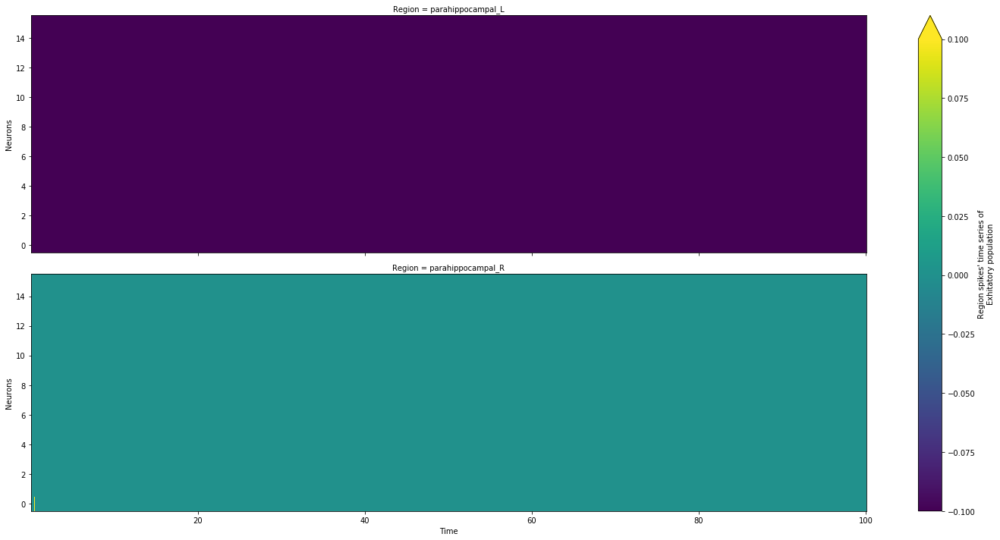

Region spikes' time series of Inhibitory population
2020-04-01 19:09:40,723 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:40,763 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:40,800 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d63c865f8>
2020-04-01 19:09:40,801 - DEBUG - matplotlib.colorbar - Using auto colorbar locator on colorbar
2020-04-01 19:09:40,802 - DEBUG - matplotlib.colorbar - locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x7f8d63c865f8>
2020-04-01 19:09:40,804 - DEBUG - matplotlib.colorbar - Setting pcolormesh
2020-04-01 19:09:40,823 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:40,861 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:40,898 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:40,980 - DEBUG - matplotlib.axes._base - update_title_pos
2020-04-01 19:09:41,016 - DEBUG - matplotlib.axes._base - upd

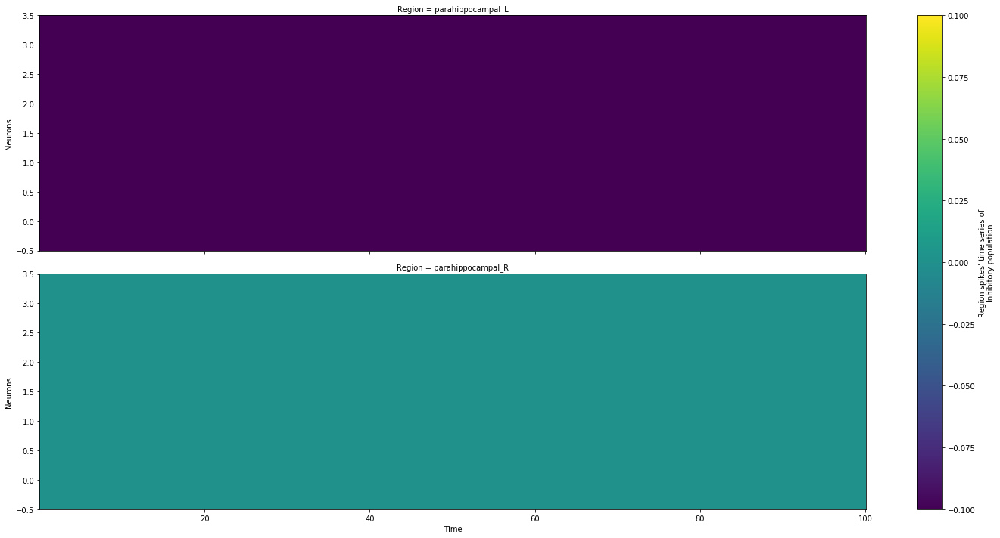

In [15]:
for i_pop, spike in enumerate(spikes):
    spike_xr = TimeSeriesXarray(spike)
    print(spike_xr.name)
    spike_xr.plot(y=spike_xr._data.dims[3], row=spike_xr._data.dims[2],
                  robust=True, figsize=(20, 10), plotter=plotter)

# References

1 Paula Sanz Leon, Stuart A. Knock, M. Marmaduke Woodman, Lia Domide, <br>
  Jochen Mersmann, Anthony R. McIntosh, Viktor Jirsa (2013) <br>
  The Virtual Brain: a simulator of primate brain network dynamics. <br>
  Frontiers in Neuroinformatics (7:10. doi: 10.3389/fninf.2013.00010) <br>
  https://www.thevirtualbrain.org/tvb/zwei <br>
  https://github.com/the-virtual-brain <br>

2 Ritter P, Schirner M, McIntosh AR, Jirsa VK. 2013.  <br>
  The Virtual Brain integrates computational modeling  <br>
  and multimodal neuroimaging. Brain Connectivity 3:121–145. <br>
   
3 Deco Gustavo, Ponce-Alvarez Adrian, Patric Hagmann, <br>
  Gian Luca Romani, Dante Mantini,and Maurizio Corbetta. <br>
  How local Excitation-Inhibition Ratio Impacts the Whole Brain Dynamics <br>
  The Journal of Neuroscience 34(23), 7886-7898, 2014.<br>

4 Jordan, Jakob; Mørk, Håkon; Vennemo, Stine Brekke;   Terhorst, Dennis; Peyser, <br>
  Alexander; Ippen, Tammo; Deepu, Rajalekshmi;   Eppler, Jochen Martin; <br>
  van Meegen, Alexander;   Kunkel, Susanne; Sinha, Ankur; Fardet, Tanguy; Diaz, <br>
  Sandra; Morrison, Abigail; Schenck, Wolfram; Dahmen, David;   Pronold, Jari; <br>
  Stapmanns, Jonas;   Trensch, Guido; Spreizer, Sebastian;   Mitchell, Jessica; <br>
  Graber, Steffen; Senk, Johanna; Linssen, Charl; Hahne, Jan; Serenko, Alexey; <br>
  Naoumenko, Daniel; Thomson, Eric;   Kitayama, Itaru; Berns, Sebastian;   <br>
  Plesser, Hans Ekkehard <br>
  NEST is a simulator for spiking neural network models that focuses <br>
  on the dynamics, size and structure of neural systems rather than on <br>
  the exact morphology of individual neurons. <br>
  For further information, visit http://www.nest-simulator.org. <br>
  The release notes for this release are available at  <br>
  https://github.com/nest/nest-simulator/releases/tag/v2.18.0 <br>